## <span style="color:red"> Group Project </span>
## <span style="color:green"> Real State in Germany </span>

In [2]:
# Importing the basic libraries that will help us with the data manipulation, visualization and statistical analysis
import unittest
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
from statsmodels.formula.api import ols
from scipy.stats import chi2_contingency
from statsmodels.stats.anova import anova_lm
from scipy.stats.contingency import association
# Ensuring all columns in the dataset are visible when printed
pd.set_option('display.max_columns', None)
# Supressing warnings to enusre clean outputs
warnings.filterwarnings("ignore")

In [9]:
# Showing the current working directory of the notebook
os.getcwd()

'/Users/lili/Documents/Emlyon Project/房屋预测小组作业/German-Rental-Market-Analysis-Price-Prediction'

In [12]:
# Creating an specific path where the working data is stored
path_dir = 'data'

In [13]:
# Setting the working directory to the previously named path where data resides
os.chdir(path_dir)

In [14]:
# Making sure the change of working directory was successful 
os.getcwd()

'/Users/lili/Documents/Emlyon Project/房屋预测小组作业/German-Rental-Market-Analysis-Price-Prediction/data'

First step: Load the data.

In [15]:
# Importing our data set into a panda data frame and display it 
df = pd.read_csv("immo_data.csv", encoding="utf-8")
df

UnicodeDecodeError: 'utf-8' codec can't decode byte 0x80 in position 16: invalid start byte

The dataset contains rental  listings scraped from Immoscout24, the biggest real estate platform in Germany.

It's made of 268850 rows x 49 columns containing all the features each listing has:
- **regio1** = Bundersland
- **ServiceCharge** = aucilliary costs such as electricty or internet in €
- **heatingType** = type of heating
- **lekomTvOffer** = is payed TV included if so which offer
- **telekomHybridUploadSpeed** = how fast is the hybrid inter upload speed
- **newlyConst** = is the building newly constructe
- **balcony** = does the object have a balcony
- **picturecount** = how many pictures were uploaded to the listing
- **pricetrend** = price trend as calculated by Immoscout
- **telekomUploadSpeed** = how fast is the internet upload speed
- **totalRent** = total rent (usually a sum of base rent, service charge and heating cost)
- **yearConstructed** = construction year
- **scoutId** = immoscout Id
- **noParkSpaces** = number of parking spaces
- **firingTypes** = main energy sources, separated by colon
- **hasKitchen** = has a kitchen
- **geo_bln** = bundesland (state), same as regio1
- **cellar** = has a cellar
- **yearConstructedRange** = binned construction year, 1 to 9
- **baseRent** = base rent without electricity and heating
- **houseNumber** = house number
- **livingSpace** = living space in sqm
- **geo_krs** = district, above ZIP code
- **condition** = condition of the flat
- **interiorQual** = interior quality
- **petsAllowed** = are pets allowed, can be yes, no or negotiable
- **street** = street name
- **streetPlain** = street name (plain, different formating)
- **lift** = is elevator available
- **baseRentRange** = binned base rent, 1 to 9
- **typeOfFlat** = type of flat
- **geo_plz** = ZIP code
- **noRooms** = number of rooms
- **thermalChar** = energy need in kWh/(m^2a), defines the energy efficiency class
- **floor** = which floor is the flat on
- **numberOfFloors** = number of floors in the building
- **noRoomsRange** = binned number of rooms, 1 to 5
- **garden** = has a garden
- **livingSpaceRange** = binned living space, 1 to 7
- **regio2** = District or Kreis, same as geo krs
- **regio3** = City/town
- **description** = free text description of the object
- **facilities** = free text description about available facilities
- **heatingCosts** = monthly heating costs in €
- **energyEfficiencyClass** = energy efficiency class (based on binned thermalChar, deprecated since Feb 2020)
- **lastRefurbish** = year of last renovation
- **electricityBasePrice** = monthly base price for electricity in € (deprecated since Feb 2020)
- **electricityKwhPrice** = electricity price per kwh (deprecated since Feb 2020)
- **date** = time of scraping




## Data Cleaning
The first step in preparing the dataset for modeling is to analyze the structure and handle missing values and outliers. 

In [12]:
# Display the size and structure of our dataset
df.shape 

(268850, 49)

In [13]:
# Display the data types for each column and the presence of missing values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 268850 entries, 0 to 268849
Data columns (total 49 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   regio1                    268850 non-null  object 
 1   serviceCharge             261941 non-null  float64
 2   heatingType               223994 non-null  object 
 3   telekomTvOffer            236231 non-null  object 
 4   telekomHybridUploadSpeed  45020 non-null   float64
 5   newlyConst                268850 non-null  bool   
 6   balcony                   268850 non-null  bool   
 7   picturecount              268850 non-null  int64  
 8   pricetrend                267018 non-null  float64
 9   telekomUploadSpeed        235492 non-null  float64
 10  totalRent                 228333 non-null  float64
 11  yearConstructed           211805 non-null  float64
 12  scoutId                   268850 non-null  int64  
 13  noParkSpaces              93052 non-null   f

In [14]:
# Display the summary of all variables
df.describe(include='all')

,regio1,serviceCharge,heatingType,telekomTvOffer,telekomHybridUploadSpeed,newlyConst,balcony,picturecount,pricetrend,telekomUploadSpeed,totalRent,yearConstructed,scoutId,noParkSpaces,firingTypes,hasKitchen,geo_bln,cellar,yearConstructedRange,baseRent,houseNumber,livingSpace,geo_krs,condition,interiorQual,petsAllowed,street,streetPlain,lift,baseRentRange,typeOfFlat,geo_plz,noRooms,thermalChar,floor,numberOfFloors,noRoomsRange,garden,livingSpaceRange,regio2,regio3,description,facilities,heatingCosts,energyEfficiencyClass,lastRefurbish,electricityBasePrice,electricityKwhPrice,date
count,268850,261941.000000,223994,236231,45020.0,268850,268850,268850.000000,267018.000000,235492.000000,2.283330e+05,211805.000000,2.688500e+05,93052.000000,211886,268850,268850,268850,211805.000000,2.688500e+05,197832,268850.000000,268850,200361,156185,154277,268850,197837,268850,268850.000000,232236,268850.000000,268850.000000,162344.000000,217541.000000,171118.000000,268850.000000,268850,268850.000000,268850,268850,249103,215926,85518.000000,77787,80711.000000,46846.000000,46846.000000,268850
unique,16,NaN,13,3,NaN,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,132,2,16,2,NaN,NaN,5510,NaN,419,10,4,3,52373,54490,2,NaN,10,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,419,8684,212621,189526,NaN,10,NaN,NaN,NaN,4
top,Nordrhein_Westfalen,NaN,central_heating,ONE_YEAR_FREE,NaN,False,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,gas,False,Nordrhein_Westfalen,True,NaN,NaN,1,NaN,Leipzig,well_kept,normal,negotiable,no_information,Hauptstraße,False,NaN,apartment,NaN,NaN,NaN,NaN,NaN,NaN,False,NaN,Leipzig,Innenstadt,+ MEIN GUENTZ - Quartier der Generationen\r\n+...,Laminat,NaN,C,NaN,NaN,NaN,Feb20
freq,62863,NaN,128977,227632,NaN,247679,165734,NaN,NaN,NaN,NaN,NaN,NaN,NaN,110899,176794,62863,172235,NaN,NaN,7173,NaN,13723,66591,81826,91970,71013,911,205528,NaN,131522,NaN,NaN,NaN,NaN,NaN,NaN,216093,NaN,13723,4751,216,207,NaN,14613,NaN,NaN,NaN,79276
mean,NaN,151.206113,NaN,NaN,10.0,NaN,NaN,9.791958,3.389001,28.804928,9.013315e+02,1966.400590,1.069697e+08,1.327634,NaN,NaN,NaN,NaN,3.714544,6.941294e+02,NaN,74.355548,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.765256,NaN,37283.022235,2.641261,114.749533,2.122405,3.572319,2.571542,NaN,3.070790,NaN,NaN,NaN,NaN,76.990866,NaN,2013.904536,89.113612,0.199769,NaN
std,NaN,308.295790,NaN,NaN,0.0,NaN,NaN,6.408399,1.964874,16.337151,3.323833e+04,46.992207,1.250093e+07,8.361403,NaN,NaN,NaN,NaN,2.738134,1.953602e+04,NaN,254.759208,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.214357,NaN,27798.037296,2.633440,61.653663,3.634934,6.375496,0.937594,NaN,1.407127,NaN,NaN,NaN,NaN,147.716278,NaN,10.963125,5.395805,0.009667,NaN
min,NaN,0.000000,NaN,NaN,10.0,NaN,NaN,0.000000,-12.330000,1.000000,0.000000e+00,1000.000000,2.887174e+07,0.000000,NaN,NaN,NaN,NaN,1.000000,0.000000e+00,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,852.000000,1.000000,0.100000,-1.000000,0.000000,1.000000,NaN,1.000000,NaN,NaN,NaN,NaN,0.000000,NaN,1015.000000,71.430000,0.170500,NaN
25%,NaN,95.000000,NaN,NaN,10.0,NaN,NaN,6.000000,2.000000,10.000000,4.698000e+02,1950.000000,1.066910e+08,1.000000,NaN,NaN,NaN,NaN,1.000000,3.380000e+02,NaN,54.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,NaN,9128.000000,2.000000,79.000000,1.000000,2.000000,2.000000,NaN,2.000000,NaN,NaN,NaN,NaN,54.000000,NaN,2012.000000,90.760000,0.191500,NaN
50%,NaN,135.000000,NaN,NaN,10.0,NaN,NaN,9.000000,3.390000,40.000000,6.500000e+02,1973.000000,1.111584e+08,1.000000,NaN,NaN,NaN,NaN,3.000000,4.900000e+02,NaN,67.320000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.000000,NaN,38667.000000,3.000000,107.000000,2.000000,3.000000,3.000000,NaN,3.000000,NaN,NaN,NaN,NaN,70.000000,NaN,2017.000000,90.760000,0.198500,NaN
75%,NaN,190.000000,NaN,NaN,10.0,NaN,NaN,13.000000,4.570000,40.000000,9.850000e+02,1996.000000,1.137688e+08,1.000000,NaN,NaN,NaN,NaN,5.000000,7.990000e+02,NaN,87.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,NaN,57072.000000,3.000000,140.300000,3.000000,4.000000,3.000000,NaN,4.000000,NaN,NaN,NaN,NaN,90.000000,NaN,2019.000000,90.760000,0.205500,NaN


In [15]:
# Checking for duplicate rows
rows_before = len(df)

df = df.drop_duplicates()

rows_after = len(df)

duplicates_dropped = rows_before - rows_after
duplicates_dropped

0

Even when dropping the date column (data collection date), the dataset does not contain duplicate rows that need to be treated worked on.

In [16]:
# Identify missing values in each column of the dataset
df.isnull().sum()

regio1                           0
serviceCharge                 6909
heatingType                  44856
telekomTvOffer               32619
telekomHybridUploadSpeed    223830
newlyConst                       0
balcony                          0
picturecount                     0
pricetrend                    1832
telekomUploadSpeed           33358
totalRent                    40517
yearConstructed              57045
scoutId                          0
noParkSpaces                175798
firingTypes                  56964
hasKitchen                       0
geo_bln                          0
cellar                           0
yearConstructedRange         57045
baseRent                         0
houseNumber                  71018
livingSpace                      0
geo_krs                          0
condition                    68489
interiorQual                112665
petsAllowed                 114573
street                           0
streetPlain                  71013
lift                

In [17]:
# Defining a function to obtain the percentage of null values in every row and ordering them
def check_na(data):
    na_counts = data.isna().sum()
    na_percentage = (na_counts / len(data)) * 100
    df_na_counts = pd.DataFrame({'Missing Values':na_counts.values,'Percentage Missing':na_percentage.values,'Data Type':data.dtypes}).sort_values(by='Percentage Missing',ascending=False).reset_index(names='Column')
    return df_na_counts

In [18]:
df_null = check_na(df)
df_null

,Column,Missing Values,Percentage Missing,Data Type
0,telekomHybridUploadSpeed,223830,83.254603,float64
1,electricityKwhPrice,222004,82.575414,float64
2,electricityBasePrice,222004,82.575414,float64
3,energyEfficiencyClass,191063,71.066766,object
4,lastRefurbish,188139,69.979171,float64
5,heatingCosts,183332,68.191185,float64
6,noParkSpaces,175798,65.388879,float64
7,petsAllowed,114573,42.615957,object
8,interiorQual,112665,41.906267,object
9,thermalChar,106506,39.615399,float64


The dataset contains lots of missing values, which could skew the predictions. For this reason, according to the amount of missing values contained in each column, we will impute or remove them accordingly. 

Additionally, as some rows may have multiple null values, we remove those rows with more than 15 missing values to have a more accurate dataset. 

In [19]:
df = df[df.isnull().sum(axis=1) <= 15]
df.shape

(254079, 49)

14.771 rows (5.5% of the whole data set) contained 15 or more missing values, these rows where removed.

#### Columns

**Rent columns**

There are 5 columns related to the price of the listing: ServiceCharge, totalRent, baseRent, baseRentRange

*ServiceCharge*

In [20]:
# Counts the occurrences of each unique value in the 'serviceCharge' column, including null values.
df['serviceCharge'].value_counts(dropna=False)

serviceCharge
150.00    13464
100.00    12247
200.00    10514
120.00    10133
130.00     7092
          ...  
298.30        1
256.92        1
191.34        1
97.38         1
112.13        1
Name: count, Length: 12048, dtype: int64

In [21]:
# Calculates the total number of null or missing values in the 'serviceCharge' column.
df['serviceCharge'].isnull().sum()

3885

In [22]:
# Assuming null values to be no service charges or included in total rent, replace them with 0
df['serviceCharge'].fillna(0, inplace=True)

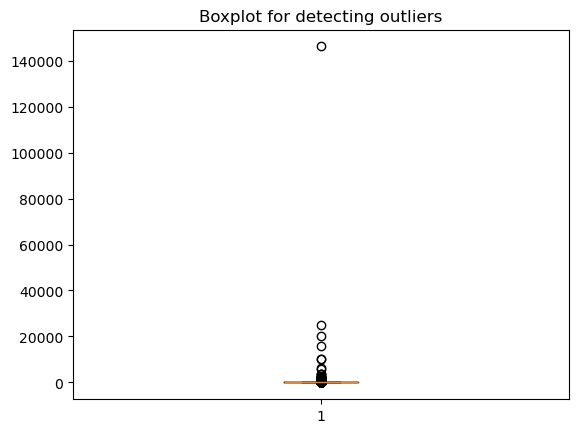

In [23]:
# Graph a boxplot to detect outliers and imputation errors
X = df['serviceCharge'].dropna().reset_index(drop=True)
# Plot boxplot
plt.boxplot(X)
plt.title("Boxplot for detecting outliers")
plt.show()

In [24]:
# Counting number of values greater than 2500 (threshold) 
print(f"Number of values above 2500: {(df['serviceCharge'] > 2500).sum()}")

Number of values above 2500: 12


In [25]:
# Substituting median values to the outliers grouped by regio1 and newlyConst assuming that service charge depends on this two variables
df['serviceCharge'] = np.where(
    df['serviceCharge'] > 2500,
    df.groupby(['regio1', 'newlyConst'])['serviceCharge'].transform('median'),
    df['serviceCharge']
)

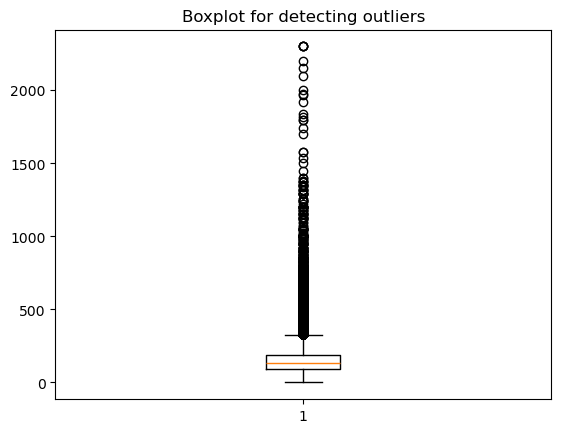

In [26]:
# Do a boxplot to check the result
X = df['serviceCharge'].reset_index(drop=True)
# Plot boxplot to ensure the distribution is fairly distributed and outliers have been treated
plt.boxplot(X)
plt.title("Boxplot for detecting outliers")
plt.show()

*baseRent*

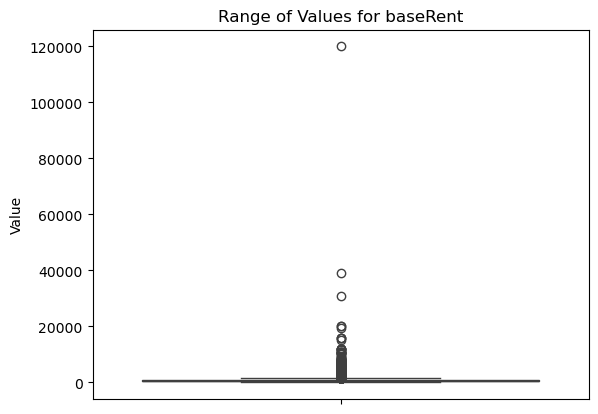

In [27]:
# Creates a boxplot to visualize the distribution and detect outliers in the 'baseRent' column.
sns.boxplot(y=df['baseRent'])
plt.title('Range of Values for baseRent')
plt.ylabel('Value')
plt.show()

In [28]:
# Calculates the total number of null or missing values in the 'baseRent' column.
df['baseRent'].isnull().sum()

0

In [29]:
# Generates summary statistics for the 'baseRent' column, including count, mean, standard deviation, min, max, and quartiles.
# This will help us understand the values inside this column
df['baseRent'].describe()

count    254079.000000
mean        644.999486
std         563.924716
min           0.000000
25%         335.000000
50%         490.000000
75%         795.000000
max      120000.000000
Name: baseRent, dtype: float64

In [30]:
# Replaces all values in the 'baseRent' column that are above the 95th percentile with the value of the 95th percentile.
df.loc[df['baseRent'] > df['baseRent'].quantile(0.95), 'baseRent'] = df['baseRent'].quantile(0.95)

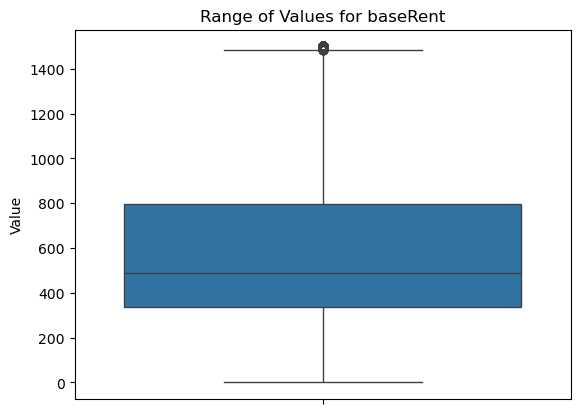

In [31]:
# Creates a boxplot to visualize the updated distribution and make sure the outliers were correctly treated
sns.boxplot(y=df['baseRent'])
plt.title('Range of Values for baseRent')
plt.ylabel('Value')
plt.show()

*heatingCost*

In [32]:
# Counts the occurrences of each unique value in the 'heatingCosts' column, including missing values.
df['heatingCosts'].value_counts(dropna=False)

heatingCosts
NaN       169982
60.00       5215
70.00       4736
80.00       4653
50.00       4219
           ...  
101.54         1
274.50         1
116.67         1
99.02          1
112.13         1
Name: count, Length: 5625, dtype: int64

In [33]:
# Heating Costs include too many null values, almost 70%. This column is going to be dropped
df.drop(columns=['heatingCosts'], inplace=True)

*totalRent*

In [34]:
# Counts the occurrences of each unique value in the 'totalRent' column, excluding missing values
df['totalRent'].value_counts(dropna = True)

totalRent
450.00     1758
500.00     1748
600.00     1666
550.00     1556
400.00     1422
           ... 
880.70        1
361.87        1
1644.97       1
841.10        1
1479.64       1
Name: count, Length: 28046, dtype: int64

In [35]:
# Total number of missing values in total rent
df['totalRent'].isnull().sum()

35926

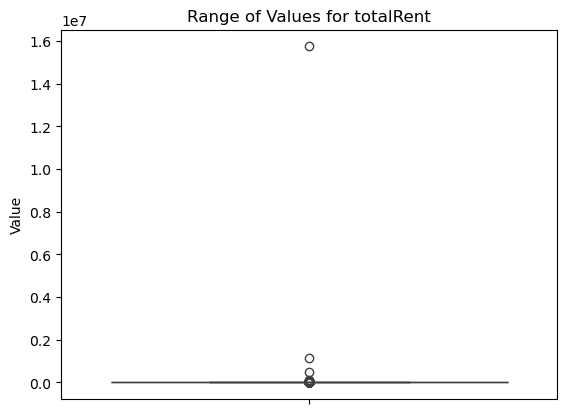

In [36]:
# Graph a boxplot to detect and treat outliers
sns.boxplot(y=df['totalRent'])
plt.title('Range of Values for totalRent')
plt.ylabel('Value')
plt.show()

In [37]:
# Visualize the charges related columns to understand if they are related
df[['baseRent', 'totalRent', 'serviceCharge']]

,baseRent,totalRent,serviceCharge
0,595.0,840.0,245.00
1,800.0,NaN,134.00
2,965.0,1300.0,255.00
3,343.0,NaN,58.15
4,765.0,903.0,138.00
...,...,...,...
268845,820.0,910.0,90.00
268846,930.0,1150.0,220.00
268847,650.0,930.0,220.00
268848,840.0,1015.0,175.00


In [38]:
# Counting the ocurrence of all values in 'totalRent'
df['totalRent'].value_counts(dropna = True)

totalRent
450.00     1758
500.00     1748
600.00     1666
550.00     1556
400.00     1422
           ... 
880.70        1
361.87        1
1644.97       1
841.10        1
1479.64       1
Name: count, Length: 28046, dtype: int64

In [39]:
# Fills missing values in the 'totalRent' column with the median value of the column
df['totalRent'] = df['totalRent'].fillna(df['totalRent'].median())

In [40]:
# To deal with outliers, clip the values in the 'totalRent' column to fall within the 10th percentile as the lower bound and 10,000 as the upper bound, replacing any values outside this range
df['totalRent'] = df['totalRent'].clip(lower=df['totalRent'].quantile(0.10), upper=10000)

In [41]:
# Summarizing 'totalRent' to ensure the cleaning was successful 
df['totalRent'].describe()

count    254079.000000
mean        795.562423
std         511.493138
min         387.592000
25%         491.000000
50%         648.000000
75%         905.000000
max       10000.000000
Name: totalRent, dtype: float64

*baseRentRange*

In [42]:
# Counts the occurrences of each unique value in the 'baseRentRange' column, including missing values
df['baseRentRange'].value_counts(dropna=False)


baseRentRange
2    52053
1    46053
5    35536
3    35030
7    25860
4    24250
6    22737
8     7768
9     4792
Name: count, dtype: int64

In [43]:
# Checking for null values in 'baseRentRange'
df['baseRentRange'].isnull().sum()

0

There are no missing values and no outliers, no need to clean this column

**Geographic columns**

*regio1*

The column regio1 represents the 16 Bundersland.
As explained by the documentation, the column is identical to  geo_bln, so we drop it.

In [44]:
df[['regio1', 'geo_bln']]

,regio1,geo_bln
0,Nordrhein_Westfalen,Nordrhein_Westfalen
1,Rheinland_Pfalz,Rheinland_Pfalz
2,Sachsen,Sachsen
3,Sachsen,Sachsen
4,Bremen,Bremen
...,...,...
268845,Bayern,Bayern
268846,Hessen,Hessen
268847,Hessen,Hessen
268848,Nordrhein_Westfalen,Nordrhein_Westfalen


In [45]:
# Dropping the column
df = df.drop(columns = 'geo_bln')

In [46]:
# Counting the occurrences in 'regio1'
df['regio1'].value_counts()

regio1
Nordrhein_Westfalen       60071
Sachsen                   55841
Bayern                    20033
Sachsen_Anhalt            19478
Hessen                    16515
Niedersachsen             15185
Baden_Württemberg         14536
Berlin                    10074
Thüringen                  7822
Rheinland_Pfalz            7628
Brandenburg                6803
Schleswig_Holstein         6384
Mecklenburg_Vorpommern     6279
Hamburg                    3522
Bremen                     2724
Saarland                   1184
Name: count, dtype: int64

In [47]:
# Display the regional columns to examine their contents and relationships
df[['regio2', 'regio3', 'geo_krs', 'geo_plz']]

,regio2,regio3,geo_krs,geo_plz
0,Dortmund,Schüren,Dortmund,44269
1,Rhein_Pfalz_Kreis,Böhl_Iggelheim,Rhein_Pfalz_Kreis,67459
2,Dresden,Äußere_Neustadt_Antonstadt,Dresden,1097
3,Mittelsachsen_Kreis,Freiberg,Mittelsachsen_Kreis,9599
4,Bremen,Neu_Schwachhausen,Bremen,28213
...,...,...,...,...
268845,Weilheim_Schongau_Kreis,Eberfing,Weilheim_Schongau_Kreis,82390
268846,Bergstraße_Kreis,Viernheim,Bergstraße_Kreis,68519
268847,Limburg_Weilburg_Kreis,Limburg_an_der_Lahn,Limburg_Weilburg_Kreis,65552
268848,Köln,Dellbrück,Köln,51069


In [48]:
# Regio2 and geo_krs are identical, so we drop geo_krs
df.drop(columns=['geo_krs'], inplace=True)

In [49]:
# Checking the occurrences of regio 2 and 3 
df['regio2'].value_counts(dropna=False)

regio2
Leipzig                         13108
Chemnitz                        12305
Berlin                          10074
Dresden                          7289
Magdeburg                        4767
                                ...  
Lichtenfels_Kreis                  28
Freyung_Grafenau_Kreis             26
Haßberge_Kreis                     23
Neustadt_a.d._Waldnaab_Kreis       14
Kronach_Kreis                      11
Name: count, Length: 419, dtype: int64

In [50]:
df['regio3'].value_counts(dropna=False) 

regio3
Innenstadt         4427
Stadtmitte         2584
Altstadt           2198
Sonnenberg         1851
Kaßberg            1686
                   ... 
Kruckel               1
Westrich              1
Möbisburg_Rhoda       1
Aresing               1
Eberfing              1
Name: count, Length: 8495, dtype: int64

In [51]:
# Ensuring there are no null values in these columns and therefore there is no need to work on cleaning them
print(df['regio2'].isnull().sum())
print(df['regio3'].isnull().sum())
print(df['geo_plz'].isnull().sum())

0
0
0


*street*

In [52]:
# Checking and counting the values that compone the street variable
df['street'].value_counts(dropna=False)

street
no_information                      61732
Hauptstra&szlig;e                     893
Bahnhofstra&szlig;e                   828
Leipziger Stra&szlig;e                425
Bahnhofstr.                           405
                                    ...  
Hemsbergstra&szlig;e                    1
Fellingsh&auml;user Stra&szlig;e        1
Schiillerstrasse                        1
K&uuml;hleweinstr.                      1
Robert-Di&szlig;mann-Str.               1
Name: count, Length: 51168, dtype: int64

Being the column 'street' filled with empty values (no_information), we decided to drop the column, being redundant also with streetPlain

In [53]:
df.drop(columns=['street'], inplace=True)

*street Plain*

In [54]:
# 'streetPlain' contains the same values as street but correctly formatted to show German characters
df['streetPlain'].value_counts(dropna=False)

streetPlain
NaN                    61732
Hauptstraße              868
Bahnhofstraße            809
Leipziger_Straße         413
Bahnhofstr.              396
                       ...  
Zypressenstraße            1
Birnauer_Straße            1
Lerchenfeld_3_d            1
Franz-Petrich-Str.         1
Robert-Dißmann-Str.        1
Name: count, Length: 53245, dtype: int64

In [55]:
# Filling the nan values with undisclosed
df['streetPlain'].fillna('Undisclosed', inplace=True)

**House Features**

*Heating type*

In [ ]:
# Counting the occurrence of the 'heatingTypes' listed
df['heatingType'].value_counts(dropna=False)

heatingType
central_heating                   126260
NaN                                34881
district_heating                   24496
gas_heating                        19380
self_contained_central_heating     18575
floor_heating                      17347
oil_heating                         4894
heat_pump                           2666
combined_heat_and_power_plant       1964
night_storage_heater                1322
wood_pellet_heating                  949
electric_heating                     852
stove_heating                        328
solar_heating                        165
Name: count, dtype: int64

In [57]:
# In the case of heating type the null values will be replaced by not mentioned
df['heatingType'].fillna('Not_Mentioned', inplace= True)

**Telekom Tv Offer**

In [ ]:
# Counting the occurrence of the 'telekomTvOffer' listed by owners
df['telekomTvOffer'].value_counts(dropna=False)

telekomTvOffer
ONE_YEAR_FREE    217278
NaN               28746
NONE               4666
ON_DEMAND          3389
Name: count, dtype: int64

In [59]:
# For the telekom TV offer we assume that if it is not mentioned, there is no offer, and therefore we replace with none 
df['telekomTvOffer'].fillna('NONE', inplace= True)

**telekomHybridUploadSpeed**

In [ ]:
# Counting null values in the 'telekomHybridUploadSpeed' column
df['telekomHybridUploadSpeed'].isnull().sum()

210391

For the telekom hybrid upload speed there is more than 80% of null values, so we decide not to replace null values but to get rid of this column 

In [61]:
df.drop('telekomHybridUploadSpeed', axis= 1, inplace= True)

The same reasoning was applied to 'pricetrend', which has 68% of null values.
This column was also removed due to the unclear meaning, as it's a price trend calculated by Immoscout (scraped data website)

In [62]:
df.drop('pricetrend', axis=1, inplace= True)

**newlyConst**

In [ ]:
# Counting the values that compose 'newlyConst'
df['newlyConst'].value_counts()

newlyConst
False    233736
True      20343
Name: count, dtype: int64

There are no null values and it is clear that most offers are not new buildings

**balcony**

In [ ]:
# Counting the properties that have a 'balcony'
df['balcony'].value_counts()

balcony
True     159017
False     95062
Name: count, dtype: int64

No null values, no need to use imputation techniques

**Picture count**

As it represents the number of pictures included in the listing on the website, we decided to remove the column 

In [65]:
df.drop('picturecount', axis= 1, inplace= True)

**Telekom Upload Speed**

In [66]:
df['telekomUploadSpeed'].value_counts(dropna=False)

telekomUploadSpeed
40.0     150494
2.4       41354
10.0      31404
NaN       29433
5.0         988
1.0         206
100.0       141
4.0          59
Name: count, dtype: int64

In [67]:
# Assuming that the internet speed usually depends a lot on the region where the house is located, we include an imputation method that fills null values with the median of the region in which the offer is located
df['telekomUploadSpeed'] = np.where(
    df['telekomUploadSpeed'].isna(),
    df.groupby(['regio1'])['telekomUploadSpeed'].transform('median'),
    df['telekomUploadSpeed']
)

In [ ]:
# Ensuring the nan values where correctly filled
df['telekomUploadSpeed'].value_counts(dropna=False)

telekomUploadSpeed
40.0     179927
2.4       41354
10.0      31404
5.0         988
1.0         206
100.0       141
4.0          59
Name: count, dtype: int64

**yearConstructed**

In [ ]:
# Counting the values of 'yearConstructed' to analyze how many  null values are there and examine the years given
df['yearConstructed'].value_counts(dropna=False)

yearConstructed
NaN       45566
2019.0    10467
1900.0    10188
2018.0     8515
1995.0     4311
          ...  
1359.0        1
1027.0        1
1787.0        1
1627.0        1
1572.0        1
Name: count, Length: 462, dtype: int64

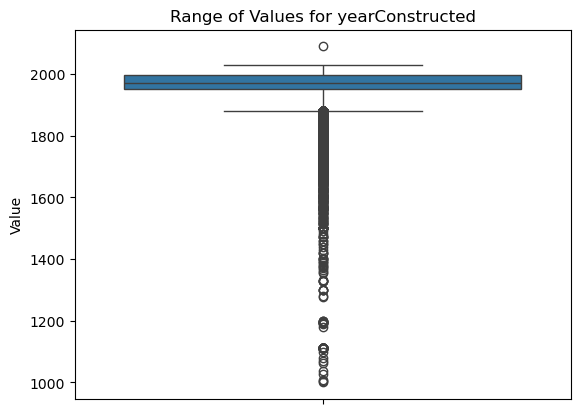

In [ ]:
# Do a boxplot of the year to identify possible imputation errors and outliers
sns.boxplot(y=df['yearConstructed'])
plt.title('Range of Values for yearConstructed')
plt.ylabel('Value')
plt.show()

In [ ]:
# Removing all values above 2024 as we interpret them as typing mistakes
df['yearConstructed'] = df['yearConstructed'].clip(lower = df['yearConstructed'].quantile(0.25), upper= 2024)

In [72]:
# Substitute missing values with the median
df['yearConstructed'] = df['yearConstructed'].fillna(df['yearConstructed'].median())

**scoutId**

The column scoutId contains unique values for each row, therefore we decided to drop the column

In [73]:
df['scoutId'].nunique()

254079

In [74]:
df = df.drop(columns = 'scoutId')

**noParkSpaces**

In [75]:
# In parking spaces we fill the empty values with 0 assuming that if it is not specified, the offer does not include a parking space
df.fillna({'noParkSpaces': 0}, inplace=True)

In [ ]:
# Counting the values to ensure that nan values have been correctly used
df['noParkSpaces'].value_counts()

noParkSpaces
0.0     167154
1.0      76855
2.0       8684
3.0        397
4.0        131
         ...  
70.0         1
87.0         1
64.0         1
93.0         1
58.0         1
Name: count, Length: 71, dtype: int64

In [ ]:
# Clipping the upper 10 values as they seem to be typing mistakes
df['noParkSpaces'] = df['noParkSpaces'].clip(upper=10)

**firingTypes**

In [ ]:
# Identifying the types of heating the property has and finding nan values
df['firingTypes'].value_counts(dropna=False)

firingTypes
gas                                                                                                  108607
district_heating                                                                                      49054
NaN                                                                                                   45519
oil                                                                                                   17770
natural_gas_light                                                                                     10027
                                                                                                      ...  
geothermal:solar_heating:pellet_heating:gas                                                               1
gas:oil:electricity                                                                                       1
district_heating:combined_heat_and_power_fossil_fuels:combined_heat_and_power_regenerative_energy         1
pellet_heating:w

In [79]:
# Substitute firing types, in the case that a house has many types we fill them with multiple
df.loc[df['firingTypes'].str.contains(':|and', na=False), 'firingTypes'] = 'multiple'

In [80]:
df['firingTypes'].value_counts(dropna=False)

firingTypes
gas                             108607
district_heating                 49054
NaN                              45519
oil                              17770
natural_gas_light                10027
electricity                       4751
natural_gas_heavy                 4522
multiple                          4501
pellet_heating                    2455
geothermal                        2398
local_heating                      921
environmental_thermal_energy       897
steam_district_heating             784
liquid_gas                         444
solar_heating                      442
heat_supply                        391
wood_chips                         188
wood                               161
bio_energy                         135
hydro_energy                        52
coal                                38
wind_energy                         15
coal_coke                            7
Name: count, dtype: int64

In [81]:
# Researched and found out that about 50% of houses in Germany use gas as firing type, so null values are filled with 'gas' 
df.fillna({'firingTypes': 'gas'}, inplace=True)

**hasKitchen**

In [82]:
df['hasKitchen'].value_counts()

hasKitchen
False    167188
True      86891
Name: count, dtype: int64

No null values in this column, so there is no need to input values

**cellar**

In [83]:
df['cellar'].value_counts()

cellar
True     166860
False     87219
Name: count, dtype: int64

No null values in cellar either, making it not necessary to work on this column

**yearConstructedRange**

In [ ]:
# Identifying the values that compone this variable
df['yearConstructedRange'].value_counts()

yearConstructedRange
1.0    53484
2.0    45276
9.0    27643
5.0    25902
3.0    24006
4.0    17822
8.0     7395
6.0     3582
7.0     3403
Name: count, dtype: int64

In [ ]:
# Summing up the null values
df['yearConstructedRange'].isnull().sum()

45566

In [ ]:
# Retrieves the first value from the 'yearConstructedRange' column where 'yearConstructed' is 1973 and 'yearConstructedRange' is not missing.
df.loc[(df['yearConstructed'] == 1973) & (df['yearConstructedRange'].notna()), 'yearConstructedRange'].values[0]

3.0

In [ ]:
# Filling the null values with 3
df['yearConstructedRange'] = df['yearConstructedRange'].fillna(3)

**houseNumber**

In [88]:
df['houseNumber'].value_counts(dropna=False)

houseNumber
NaN           61735
1              6980
2              6591
4              5660
3              5557
              ...  
Whg-Nr. 40        1
235a              1
147c IIIli        1
16/0402           1
32 (WE 66)        1
Name: count, Length: 5330, dtype: int64

In [89]:
# We are dropping the house Number column as it wont help classify or predict the outcomes we choose
df.drop('houseNumber', axis= 1, inplace= True)

**livingSpace**

Assuming that a living room must be bigger than 5 sqm, as well as being smaller than 450 sqm.

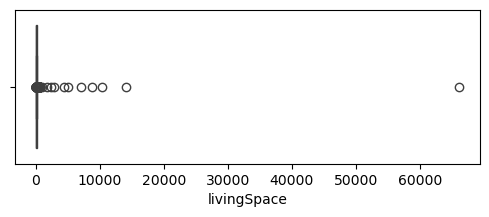

In [ ]:
# Create boxplots for identifying 'livingSpace' outliers and imputation errors
plt.figure(figsize=(6,2))
sns.boxplot(x = df['livingSpace'])
# Filters rows where 'livingSpace' is less than or equal to 5.0 and selects the columns 
# 'livingSpace', 'totalRent', 'baseRent', and 'serviceCharge'.
# Sorts the resulting rows by 'livingSpace', 'totalRent', 'baseRent', and 'serviceCharge' in ascending order.plt.show()

In [ ]:
# Filters rows where 'livingSpace' is less than or equal to 5.0 and selects the columns 'livingSpace', 'totalRent', 'baseRent', and 'serviceCharge'. Sort the resulting rows by 'livingSpace', 'totalRent', 'baseRent', and 'serviceCharge' in ascending order.
small_extreme = df[(df['livingSpace'] <= 5.0)][['livingSpace','totalRent','baseRent','serviceCharge']].sort_values(by=['livingSpace','totalRent','baseRent','serviceCharge'])
small_extreme.head()

,livingSpace,totalRent,baseRent,serviceCharge
35630,0.0,387.592,0.0,0.0
93073,0.0,387.592,0.0,0.0
231174,0.0,387.592,0.0,0.0
69577,0.0,387.592,0.0,1.5
232236,0.0,387.592,10.0,80.0


In [ ]:
# Filters rows where 'livingSpace' is greater than or equal to 450.0 and selects the columns 'livingSpace', 'totalRent', 'baseRent', and 'serviceCharge'.
big_extreme  = df[(df['livingSpace'] >= 450.0)][['livingSpace','totalRent','baseRent','serviceCharge']].sort_values(by=['livingSpace','totalRent','baseRent','serviceCharge'],ascending = [False,True,True,True])
big_extreme.head()

,livingSpace,totalRent,baseRent,serviceCharge
151184,66100.0,1400.0,1200.0,115.00
243713,14000.0,648.0,1500.0,135.00
223187,10259.0,1641.5,1385.0,128.25
51540,8684.0,650.0,504.0,146.00
202205,7008.0,648.0,519.0,107.00


In [ ]:
# Having identified that extremely small and big offers seem as imputation errors, and as they are not too many rows, we can drop them
df.drop(small_extreme.index,inplace=True)
df.drop(big_extreme.index,inplace=True)

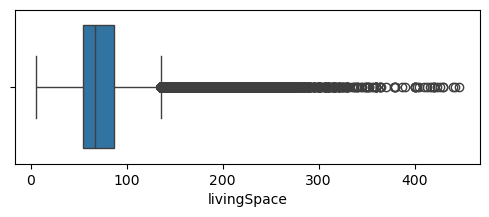

In [ ]:
# Plotting a graph that ensures us that the column is now clean
plt.figure(figsize=(6,2))
sns.boxplot(x = df['livingSpace'])
plt.show()

**condition**

In [ ]:
# Listing all values within 'condition' and their ocurrence
df['condition'].value_counts(dropna=False)

condition
well_kept                             65490
NaN                                   56898
refurbished                           26542
fully_renovated                       25969
mint_condition                        21608
first_time_use                        21447
modernized                            17009
first_time_use_after_refurbishment    15449
negotiable                             2212
need_of_renovation                     1346
ripe_for_demolition                       3
Name: count, dtype: int64

In [96]:
# Considering that well kept is the most common value and that unless specified otherwise we can assume that the spaces offered for rental are in a good enough condition to be habitable, we fill the null with well kept
df['condition'].fillna('well_kept', inplace=True)

**interiorQual**

In [ ]:
# Listing the values in 'interiorQual' and their ocurrence
df['interiorQual'].value_counts(dropna=False)

interiorQual
NaN              99868
normal           80695
sophisticated    63977
luxury            7551
simple            1882
Name: count, dtype: int64

In [ ]:
# Fill null values with normal as it is the most common and if not specified we can assume that the interior is in normal condition
df['interiorQual'].fillna('normal', inplace=True)
# Also transform simple to normal to avoid adding a category with few values and similar meaning
df['interiorQual'].replace('simple', 'normal', inplace=True)

**petsAllowed**

In [ ]:
# Listing the categories available in the 'petsAllowed' column to find the categories
df['petsAllowed'].value_counts(dropna=False)

petsAllowed
NaN           103049
negotiable     90571
no             50326
yes            10027
Name: count, dtype: int64

In [100]:
# Filling nan with negotiable, understanding that most homw owners who are not specifying no pets allowed are willing to accept if given a reasonable offer
df['petsAllowed'].fillna('negotiable', inplace=True)

**lift**

In [ ]:
# Listing the occurrence of each possible value in lift
df['lift'].value_counts(dropna=False)

lift
False    192976
True      60997
Name: count, dtype: int64

No null values in this column and it is clear whether the offer has an elevator or not

**typeOfFlat**

In [ ]:
# Listing all the categories that can happen in the 'typeOfFlat' category
df['typeOfFlat'].value_counts(dropna=False)

typeOfFlat
apartment              126527
roof_storey             33184
NaN                     32026
ground_floor            29939
maisonette               8883
other                    8622
raised_ground_floor      5396
penthouse                3420
terraced_flat            3237
half_basement            1840
loft                      899
Name: count, dtype: int64

In [103]:
# Fill missing values with the mode assuming most of the offers are for apartments
df['typeOfFlat'].fillna(df['typeOfFlat'].mode()[0], inplace=True)

**noRooms**

In [ ]:
# Listing the quantity of rooms and their occurrence in each rental offer
df['noRooms'].value_counts(dropna=False)

noRooms
3.00      87579
2.00      84114
4.00      26363
1.00      25748
2.50       9038
3.50       8438
5.00       5336
1.50       3154
4.50       1955
6.00       1204
5.50        338
7.00        310
8.00        111
2.10         67
6.50         60
9.00         32
2.20         32
10.00        18
7.50         17
11.00         8
1.10          5
2.01          4
12.00         3
15.00         3
8.50          3
23.00         2
3.10          2
3.01          2
13.00         2
160.00        1
560.00        1
2.65          1
2.30          1
1.25          1
32.00         1
100.00        1
2.70          1
16.00         1
65.00         1
230.00        1
22.00         1
1.30          1
4.20          1
2.90          1
21.00         1
999.99        1
80.00         1
3.40          1
25.00         1
45.00         1
305.00        1
140.00        1
1.20          1
79.00         1
Name: count, dtype: int64

In [105]:
# We set as a maximum no. of rooms 10 
df['noRooms'] = df['noRooms'].clip(upper=10)
df['noRooms'] = df['noRooms'].round().astype(int)

**thermalChar**

In [ ]:
# Thermal char is defined as energy need in kWh/(m^2a), defines the energy efficiency class, listing their value counts to understand the behaviour
df['thermalChar'].value_counts(dropna=False)

thermalChar
NaN       93714
105.00      927
100.00      899
114.00      869
80.00       867
          ...  
155.69        1
127.88        1
100.69        1
155.28        1
160.77        1
Name: count, Length: 7803, dtype: int64

In [ ]:
# We clip the upper quantile to remove outliers that seem like imputation errors
df['thermalChar'] = df['thermalChar'].clip(upper=df['thermalChar'].quantile(0.99))

In [108]:
# Also fill the missing values with the median
df['thermalChar'].fillna(df['thermalChar'].median(), inplace=True)

**floor**

In [ ]:
# Listing the number of floors in which the apartment is 
df['floor'].value_counts(dropna=False)

floor
 1.0      62298
 2.0      55480
 NaN      41708
 3.0      37030
 0.0      24113
 4.0      19528
 5.0       7856
 6.0       2466
 7.0       1015
 8.0        570
 9.0        419
 10.0       360
-1.0        304
 11.0       231
 12.0       140
 13.0       132
 14.0       107
 15.0        61
 16.0        34
 17.0        27
 19.0        15
 21.0        12
 18.0        11
 20.0        10
 80.0         6
 22.0         4
 24.0         3
 136.0        3
 26.0         2
 98.0         2
 137.0        2
 29.0         2
 99.0         2
 45.0         1
 650.0        1
 390.0        1
 645.0        1
 105.0        1
 36.0         1
 83.0         1
 135.0        1
 41.0         1
 134.0        1
 31.0         1
 138.0        1
 32.0         1
 124.0        1
 139.0        1
 133.0        1
 37.0         1
 25.0         1
 23.0         1
 104.0        1
Name: count, dtype: int64

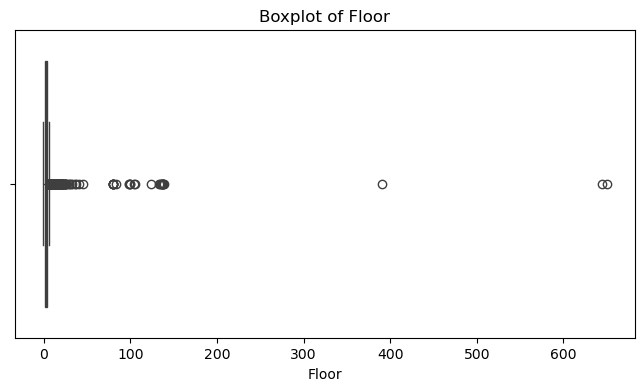

In [ ]:
# PLot a graph to identify outliers and imputation errors
plt.figure(figsize=(8, 4))
sns.boxplot(x=df['floor'])
plt.title('Boxplot of Floor')
plt.xlabel('Floor')
plt.show()

In [111]:
# In the case of floor we can detect a lot of outliers that really dont make sense
# The tallest building in germany has 63 floors, so we clip anything above it
df['floor'] = df['floor'].clip(upper=63)

In [112]:
# We fill missing values with median, considering it is two and it most of the offers are located in floor 1 or2 
df['floor'].fillna(df['floor'].median(), inplace= True)

**numberOfFloors**

In [ ]:
# Counting the occurrence of the 'numberOfFloors' that exist in the building where the apartment is set
df['numberOfFloors'].value_counts(dropna=False)

numberOfFloors
NaN      85353
3.0      50111
4.0      39325
2.0      36719
5.0      19609
1.0       8246
6.0       6214
7.0       2536
0.0       1314
8.0       1127
11.0       993
10.0       570
9.0        511
14.0       237
12.0       194
16.0       168
13.0       166
15.0       120
17.0       102
18.0        73
20.0        65
19.0        55
23.0        28
21.0        28
22.0        25
40.0        12
26.0         7
27.0         6
31.0         5
24.0         5
33.0         4
25.0         3
34.0         3
30.0         3
45.0         3
999.0        3
36.0         3
99.0         2
28.0         2
42.0         2
800.0        2
32.0         2
43.0         2
200.0        1
730.0        1
410.0        1
29.0         1
600.0        1
370.0        1
90.0         1
41.0         1
594.0        1
400.0        1
54.0         1
92.0         1
378.0        1
301.0        1
252.0        1
Name: count, dtype: int64

In [114]:
# Removing all values above 63 considering its the tallest building and there must be an imputation error
df['numberOfFloors'] = df['numberOfFloors'].clip(upper=63)

In [115]:
# Also filling null values with the median 
df['numberOfFloors'].fillna(df['numberOfFloors'].median(), inplace=True)

**noRoomsRange**

In [ ]:
# Counting the occurrence of the 'noRoomsRange'
df['noRoomsRange'].value_counts()

noRoomsRange
3    96022
2    93259
1    28910
4    28319
5     7463
Name: count, dtype: int64

**garden**

In [117]:
df['garden'].value_counts()

garden
False    203113
True      50860
Name: count, dtype: int64

No null values in the garden column, boolean variable that details if the offer contains a garden or not

**livingSpaceRange**

In [ ]:
# Counting all values in 'livingSpaceRange' 
df['livingSpaceRange'].value_counts()

livingSpaceRange
3    78296
2    72700
4    40269
1    24950
5    19342
6    12123
7     6293
Name: count, dtype: int64

**description & facilities**

In [119]:
df = df.drop(columns=['description', 'facilities'])

Dropped both of the columns because they are written in German and from what we can infer they are detailing all the information already contained in the variables

**energyEfficiencyClass**

In [ ]:
# Identifying null and other values inside this column
df['energyEfficiencyClass'].value_counts(dropna=False)

energyEfficiencyClass
NaN               176793
C                  14561
NO_INFORMATION     14036
D                  13831
B                  11268
E                   7905
A                   4906
F                   4441
A_PLUS              3558
G                   1781
H                    893
Name: count, dtype: int64

In [121]:
# Replacing the null values of energyEffiencyClass with the already existing category NO_INFORMATION
df['energyEfficiencyClass'].fillna('NO_INFORMATION', inplace=True)

**lastRefurbish**

In [ ]:
# Converts the 'lastRefurbish' column to numeric values, coercing invalid entries to missing values
df['lastRefurbish'] = pd.to_numeric(df['lastRefurbish'], errors='coerce')

In [ ]:
# Count values inside this column to identify mistakes and outliers
df['lastRefurbish'].value_counts(dropna=False)

lastRefurbish
NaN       174020
2019.0     19912
2018.0     13082
2017.0      7049
2016.0      5637
           ...  
1893.0         1
1905.0         1
1965.0         1
1964.0         1
1918.0         1
Name: count, Length: 88, dtype: int64

In [ ]:
# Replaces values in the 'lastRefurbish' column with 'neverRefurbished' for rows where the year is less than 1950 or greater than 2024.
df.loc[(df['lastRefurbish'] < 1950) | (df['lastRefurbish'] > 2024), 'lastRefurbish'] = 'neverRefurbished'

In [ ]:
# Counting values to ensure the imputation worked correctly
df['lastRefurbish'].value_counts(dropna=False)

lastRefurbish
NaN       174020
2019.0     19912
2018.0     13082
2017.0      7049
2016.0      5637
           ...  
1956.0         2
1973.0         1
1965.0         1
1964.0         1
1957.0         1
Name: count, Length: 70, dtype: int64

In [ ]:
# Filling null values with 'neverRefurbished'
df['lastRefurbish'].fillna('neverRefurbished', inplace=True)

In [ ]:
# Printing the values to make sure all years make sense
df['lastRefurbish'].unique()

array(['neverRefurbished', 2019.0, 2012.0, 2018.0, 1996.0, 2015.0, 1998.0,
       1997.0, 2014.0, 2017.0, 2000.0, 2003.0, 2005.0, 2016.0, 1995.0,
       2020.0, 2001.0, 2007.0, 2011.0, 1994.0, 1999.0, 2009.0, 1992.0,
       2013.0, 2006.0, 2010.0, 1980.0, 2004.0, 2008.0, 2002.0, 1985.0,
       1990.0, 1993.0, 1982.0, 1989.0, 1991.0, 1966.0, 1967.0, 1976.0,
       1988.0, 1978.0, 1984.0, 1971.0, 1963.0, 1970.0, 1986.0, 1954.0,
       1983.0, 1974.0, 1951.0, 1973.0, 1981.0, 1987.0, 1969.0, 1979.0,
       1950.0, 1977.0, 1955.0, 1960.0, 1975.0, 1961.0, 1972.0, 1968.0,
       1964.0, 1956.0, 1965.0, 2021.0, 1958.0, 1957.0], dtype=object)

**electricityBasePrice & electricityKwhPrice & date**

In [128]:
df['electricityBasePrice'].value_counts(dropna=False)

electricityBasePrice
NaN      208368
90.76     41741
71.43      3864
Name: count, dtype: int64

In [129]:
# We drop the electricity price as they contain more than 80% null values and date too because it only reflects when was the scraping done
df.drop(columns=['electricityBasePrice', 'electricityKwhPrice', 'date'], inplace=True)

With all the columns and rows correctly cleaned we analyze the dataset again to make sure it is now ready to be worked on

In [130]:
df.head()

,regio1,serviceCharge,heatingType,telekomTvOffer,newlyConst,balcony,telekomUploadSpeed,totalRent,yearConstructed,noParkSpaces,firingTypes,hasKitchen,cellar,yearConstructedRange,baseRent,livingSpace,condition,interiorQual,petsAllowed,streetPlain,lift,baseRentRange,typeOfFlat,geo_plz,noRooms,thermalChar,floor,numberOfFloors,noRoomsRange,garden,livingSpaceRange,regio2,regio3,energyEfficiencyClass,lastRefurbish
0,Nordrhein_Westfalen,245.00,central_heating,ONE_YEAR_FREE,False,False,10.0,840.0,1965.0,1.0,oil,False,True,2.0,595.0,86.00,well_kept,normal,negotiable,Schüruferstraße,False,4,ground_floor,44269,4,181.4,1.0,3.0,4,True,4,Dortmund,Schüren,NO_INFORMATION,neverRefurbished
1,Rheinland_Pfalz,134.00,self_contained_central_heating,ONE_YEAR_FREE,False,True,10.0,648.0,1950.0,2.0,gas,False,False,1.0,800.0,89.00,refurbished,normal,no,Undisclosed,False,5,ground_floor,67459,3,107.0,2.0,3.0,3,False,4,Rhein_Pfalz_Kreis,Böhl_Iggelheim,NO_INFORMATION,2019.0
2,Sachsen,255.00,floor_heating,ONE_YEAR_FREE,True,True,2.4,1300.0,2019.0,1.0,gas,False,True,9.0,965.0,83.80,first_time_use,sophisticated,negotiable,Turnerweg,True,6,apartment,1097,3,107.0,3.0,4.0,3,False,4,Dresden,Äußere_Neustadt_Antonstadt,NO_INFORMATION,neverRefurbished
3,Sachsen,58.15,district_heating,ONE_YEAR_FREE,False,True,40.0,648.0,1964.0,0.0,district_heating,False,False,2.0,343.0,58.15,well_kept,normal,negotiable,Glück-Auf-Straße,False,2,other,9599,3,86.0,3.0,3.0,3,False,2,Mittelsachsen_Kreis,Freiberg,NO_INFORMATION,neverRefurbished
4,Bremen,138.00,self_contained_central_heating,NONE,False,True,40.0,903.0,1950.0,0.0,gas,False,False,1.0,765.0,84.97,refurbished,normal,negotiable,Hermann-Henrich-Meier-Allee,False,5,apartment,28213,3,188.9,1.0,3.0,3,False,4,Bremen,Neu_Schwachhausen,NO_INFORMATION,neverRefurbished


In [131]:
df.shape

(253973, 35)

In [ ]:
# Save the cleaned DataFrame to a CSV file named 'cleaned_dataset.csv' in the '../data/' directory without including the index column.
# This will help us model with a new, cleaner file.
df.to_csv('../data/cleaned_dataset.csv', index=False)

## Univatiate Analysis

In [ ]:
# Identifies all columns in the DataFrame with numerical data types and stores their names in the list 'quant_vars'
quant_vars = df.select_dtypes(include=['number']).columns.tolist()
# Identifies all columns in the DataFrame with categorical data types (object) and stores their names in the list 'cat_vars'
cat_vars = df.select_dtypes(include=['object']).columns.tolist()
# Create a new DataFrame for each one of these.
quant_data = df[quant_vars]
cat_data = df[cat_vars]

In [ ]:
# Dropping geo_krs, streetPlain, regio2, regio3 due to high cardinality
cat_data1 = cat_data.drop(columns=[ 'streetPlain', 'regio2', 'regio3','lastRefurbish','firingTypes'])

count    253973.000000
mean         73.434708
std          31.568303
min           5.580000
25%          54.170000
50%          67.230000
75%          86.630000
max         446.000000
Name: livingSpace, dtype: float64


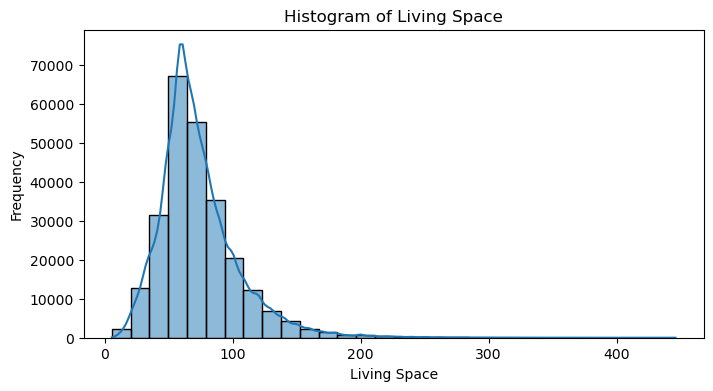

In [ ]:
# Prints summary statistics for the 'livingSpace' column-
print(df['livingSpace'].describe())
# Creates a histogram to visualize the distribution of the 'livingSpace' column, excluding missing values and including a curve for representation of distribution.
plt.figure(figsize=(8, 4))
sns.histplot(df['livingSpace'].dropna(), kde=True, bins=30)
plt.title('Histogram of Living Space')
plt.xlabel('Living Space')
plt.ylabel('Frequency')
plt.show()

Summary Statistics for 'baseRentRange':
count    253973.000000
mean          3.749044
std           2.213201
min           1.000000
25%           2.000000
50%           3.000000
75%           5.000000
max           9.000000
Name: baseRentRange, dtype: float64


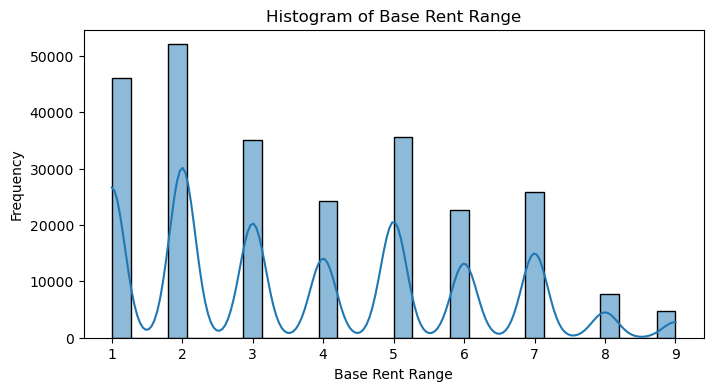

In [ ]:
# Displays summary statistics and visualizes the distribution of the 'baseRentRange' column using a histogram with a KDE curve.
print("Summary Statistics for 'baseRentRange':")
print(df['baseRentRange'].describe())
plt.figure(figsize=(8, 4))
sns.histplot(df['baseRentRange'].dropna(), kde=True, bins=30)
plt.title('Histogram of Base Rent Range')
plt.xlabel('Base Rent Range')
plt.ylabel('Frequency')
plt.show()

Frequency Counts for 'condition':
condition
well_kept                             122388
refurbished                            26542
fully_renovated                        25969
mint_condition                         21608
first_time_use                         21447
modernized                             17009
first_time_use_after_refurbishment     15449
negotiable                              2212
need_of_renovation                      1346
ripe_for_demolition                        3
Name: count, dtype: int64


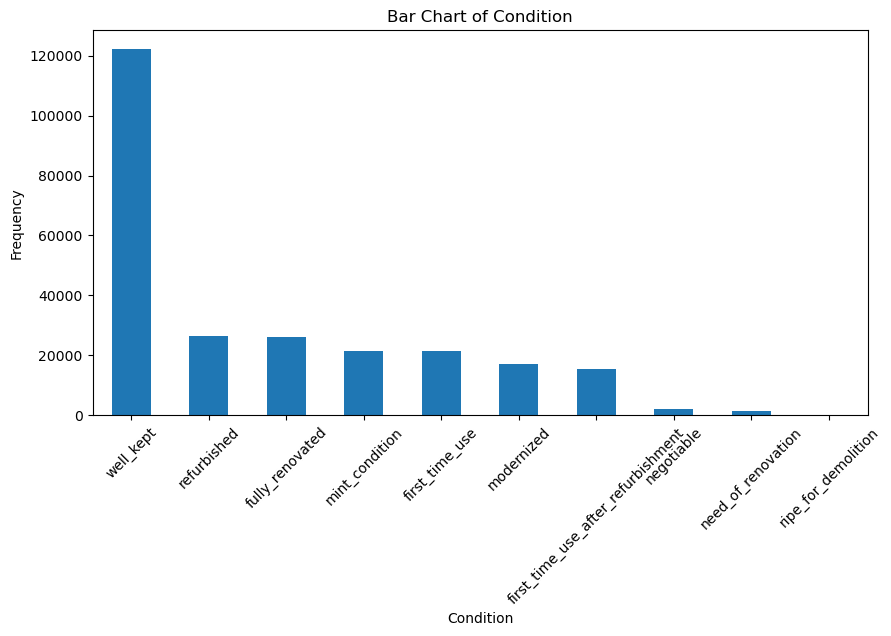

In [ ]:
# Displays frequency counts and visualizes the distribution of the 'condition' column using a bar chart
print("Frequency Counts for 'condition':")
print(df['condition'].value_counts(dropna=False))
plt.figure(figsize=(10, 5))
df['condition'].value_counts(dropna=False).plot(kind='bar')
plt.title('Bar Chart of Condition')
plt.xlabel('Condition')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

Frequency Counts for 'interiorQual':
interiorQual
normal           182445
sophisticated     63977
luxury             7551
Name: count, dtype: int64


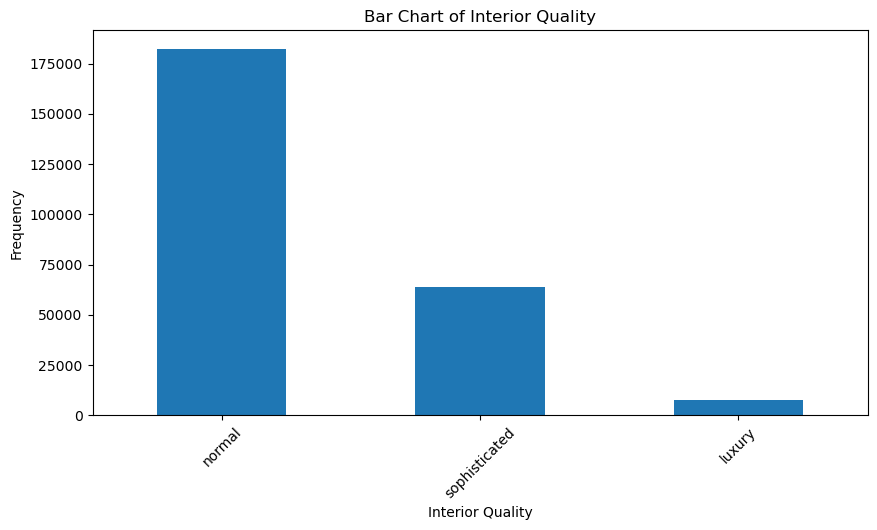

In [ ]:
# Displays frequency counts and visualizes the distribution of the 'interiorQual' column using a bar chart
print("Frequency Counts for 'interiorQual':")
print(df['interiorQual'].value_counts(dropna=False))

plt.figure(figsize=(10, 5))
df['interiorQual'].value_counts(dropna=False).plot(kind='bar')
plt.title('Bar Chart of Interior Quality')
plt.xlabel('Interior Quality')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

Frequency Counts for 'petsAllowed':
petsAllowed
negotiable    193620
no             50326
yes            10027
Name: count, dtype: int64


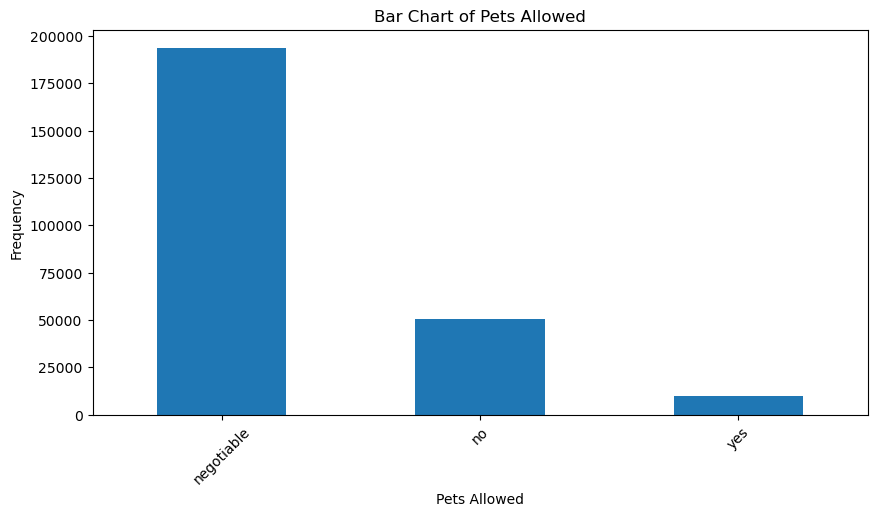

In [ ]:
# Displays frequency counts and visualizes the distribution of the 'petsAllowed' column using a bar chart
print("Frequency Counts for 'petsAllowed':")
print(df['petsAllowed'].value_counts(dropna=False))

plt.figure(figsize=(10, 5))
df['petsAllowed'].value_counts(dropna=False).plot(kind='bar')
plt.title('Bar Chart of Pets Allowed')
plt.xlabel('Pets Allowed')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

Frequency Counts for 'lift':
lift
False    192976
True      60997
Name: count, dtype: int64


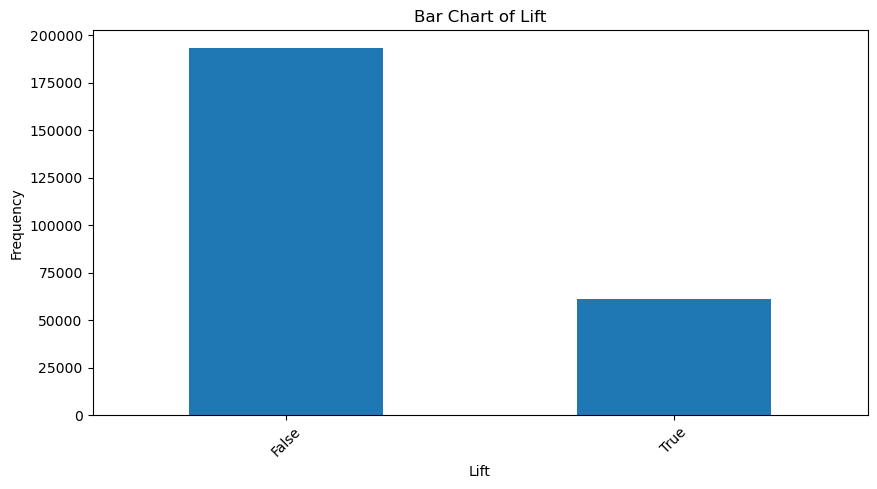

In [ ]:
# Displays frequency counts and visualizes the distribution of the 'lift' column using a bar chart
print("Frequency Counts for 'lift':")
print(df['lift'].value_counts(dropna=False))

plt.figure(figsize=(10, 5))
df['lift'].value_counts(dropna=False).plot(kind='bar')
plt.title('Bar Chart of Lift')
plt.xlabel('Lift')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Create a function that performs univariate data analysis for categorical and quantitative variables
# For categorical variables: computes frequency distributions, displays pie and bar charts
# For quantitative variables: calculates frequency distribution tables, creates histograms, cumulative frequency plots, and boxplots
def univariate_data_analysis(cat_data, quant_data):
    print('CATEGORICAL VARIABLES')

    ### categorical data analysis 
    for col in cat_data.columns:
        print(f'{col}')

        # Summary table
        dict_data = cat_data[col].value_counts()
        sum_table = dict_data.to_dict()
        for i in sum_table:
            sum_table[i] = round(sum_table[i] / len(cat_data) * 100, 3)
        print(sum_table, '\n\n')

        # Pie chart (with percentages)
        plt.figure(figsize=(3, 3))
        plt.pie(sum_table.values(), labels = sum_table.keys(), autopct='%1.1f%%')
        plt.title(f'Pie chart of {col}', fontsize = 10)
        plt.show()

        # Bar chart
        fig, ax = plt.subplots(figsize = (3,3))
        ax.bar(sum_table.keys(), sum_table.values(), label = sum_table.keys())
        ax.set_xlabel(f'{col}')
        ax.set_ylabel('frequency')
        plt.xticks(rotation=90)
        plt.title(f'Bar chart of {col}', fontsize = 10)
        plt.show() 

    ### quantitative data analysis
    print('QUANTITATIVE VARIABLES', '\n')
    for quant in quant_data.columns:
        print(f'{quant}')

        # Frequency distribution table: 
        min_val = int(np.floor(min(quant_data[quant]) / 10) * 10)
        max_val = int(np.ceil(max(quant_data[quant]) / 10) * 10)
        range1 = max_val - min_val
        num_bins = (range1 // 10)
        bins = range1 / num_bins

        bins_lower = [min_val + bins * (i) for i in range(0, num_bins)]
        bins_upper = [min_val + bins * (i+1) for i in range(0, num_bins)]
        mid_points = [min_val + bins * (i + 0.5) for i in range(0, num_bins)]
        bin_indices = [
            int(np.floor(num_bins * (x - min_val) / range1))
            for x in quant_data[quant]
            if x is not None and not np.isnan(x)]
        rel_freq = np.zeros(num_bins) 
        for j in bin_indices:
            rel_freq[min(j, num_bins - 1)] += 1
        for i in range(len(rel_freq)):
            rel_freq[i] = rel_freq[i] / len(quant_data) * 100

        cum_y = np.cumsum(rel_freq)
        ds = []
        for i in range(num_bins):
            ds.append(
                {
                    "lower": bins_lower[i],
                    "upper": bins_upper[i],
                    "mid": mid_points[i],
                    "freq": rel_freq[i],
                    "cum_freq": cum_y[i],
                }
            )
        display(pd.DataFrame(ds))

        # Histogram 
        fig, ax1 = plt.subplots(figsize = (4,3))
        ax1.bar(mid_points, rel_freq, width = 8, label = f'{quant}')
        ax1.set_ylabel('Frequencies')
        ax1.tick_params(axis='y') 
        ax2 = ax1.twinx()
        ax2.plot(mid_points, cum_y, 'orange', label = 'Cumulative frequency', marker = '.', linewidth = 0.8)
        ax2.set_ylabel('Cummulative freq')
        ax2.tick_params(axis='y')
        plt.tight_layout()
        plt.title(f'Histogram of {quant}', fontsize = 10)
        plt.show()

        # Boxplot
        plt.figure(figsize=(4, 3))
        plt.boxplot(quant_data[quant], vert = 0)
        plt.title(f'Box plot of {quant}', fontsize = 10)
        plt.show()

In [142]:
# Checking for nan values in all categorical columns before running univariate analysis
nan_columns = cat_data.columns[cat_data.isnull().any()].tolist()
print(f"Categorical columns containing NaN: {nan_columns}")

Categorical columns containing NaN: []


CATEGORICAL VARIABLES
regio1
{'Nordrhein_Westfalen': 23.644, 'Sachsen': 21.983, 'Bayern': 7.882, 'Sachsen_Anhalt': 7.668, 'Hessen': 6.501, 'Niedersachsen': 5.977, 'Baden_Württemberg': 5.716, 'Berlin': 3.963, 'Thüringen': 3.08, 'Rheinland_Pfalz': 3.002, 'Brandenburg': 2.676, 'Schleswig_Holstein': 2.512, 'Mecklenburg_Vorpommern': 2.472, 'Hamburg': 1.387, 'Bremen': 1.072, 'Saarland': 0.465} 




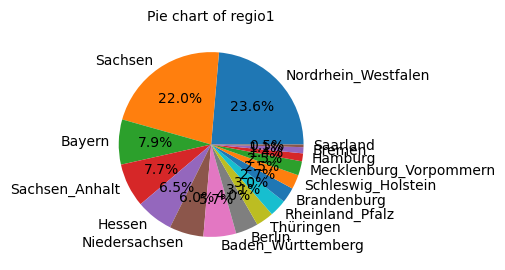

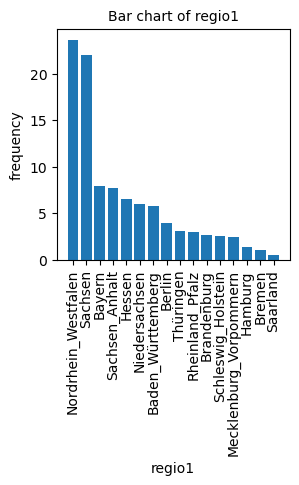

heatingType
{'central_heating': 49.697, 'Not_Mentioned': 13.727, 'district_heating': 9.64, 'gas_heating': 7.626, 'self_contained_central_heating': 7.313, 'floor_heating': 6.826, 'oil_heating': 1.926, 'heat_pump': 1.049, 'combined_heat_and_power_plant': 0.773, 'night_storage_heater': 0.521, 'wood_pellet_heating': 0.374, 'electric_heating': 0.335, 'stove_heating': 0.129, 'solar_heating': 0.065} 




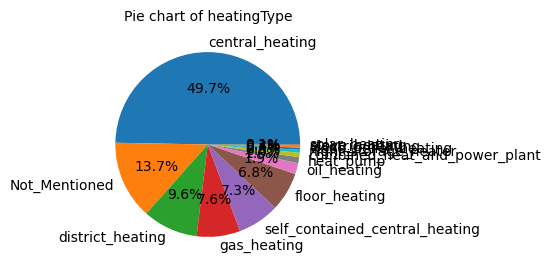

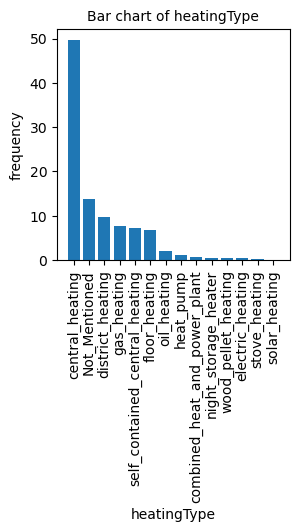

telekomTvOffer
{'ONE_YEAR_FREE': 85.515, 'NONE': 13.152, 'ON_DEMAND': 1.334} 




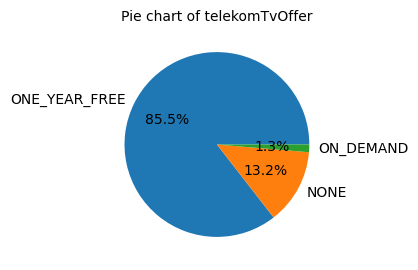

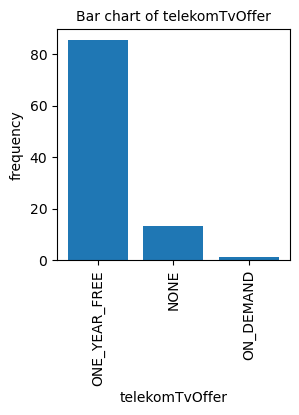

condition
{'well_kept': 48.189, 'refurbished': 10.451, 'fully_renovated': 10.225, 'mint_condition': 8.508, 'first_time_use': 8.445, 'modernized': 6.697, 'first_time_use_after_refurbishment': 6.083, 'negotiable': 0.871, 'need_of_renovation': 0.53, 'ripe_for_demolition': 0.001} 




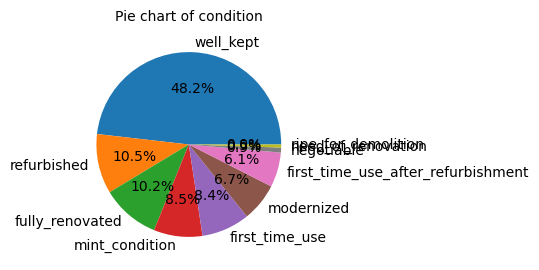

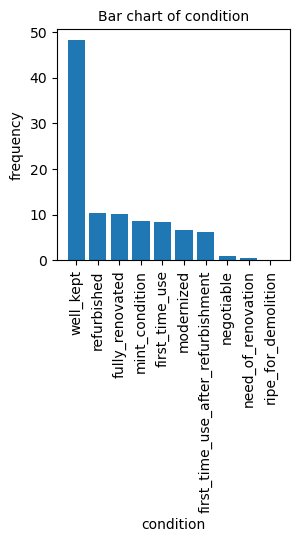

interiorQual
{'normal': 71.836, 'sophisticated': 25.19, 'luxury': 2.973} 




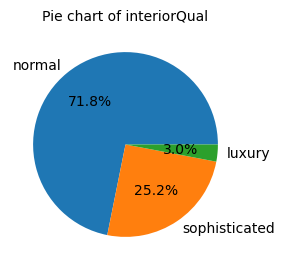

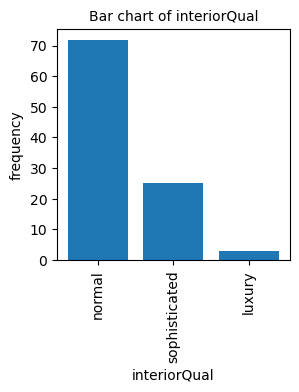

petsAllowed
{'negotiable': 76.236, 'no': 19.815, 'yes': 3.948} 




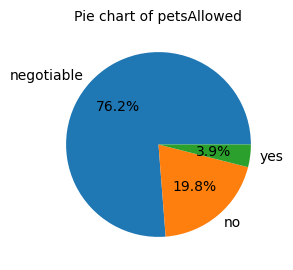

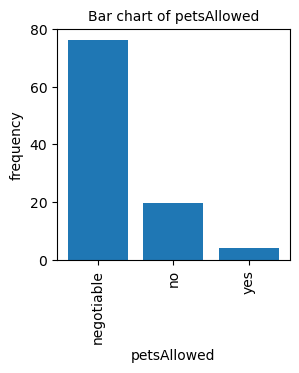

typeOfFlat
{'apartment': 62.429, 'roof_storey': 13.066, 'ground_floor': 11.788, 'maisonette': 3.498, 'other': 3.395, 'raised_ground_floor': 2.125, 'penthouse': 1.347, 'terraced_flat': 1.275, 'half_basement': 0.724, 'loft': 0.354} 




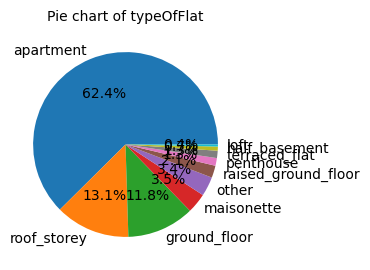

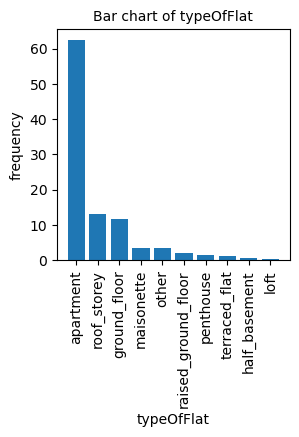

energyEfficiencyClass
{'NO_INFORMATION': 75.138, 'C': 5.733, 'D': 5.446, 'B': 4.437, 'E': 3.113, 'A': 1.932, 'F': 1.749, 'A_PLUS': 1.401, 'G': 0.701, 'H': 0.352} 




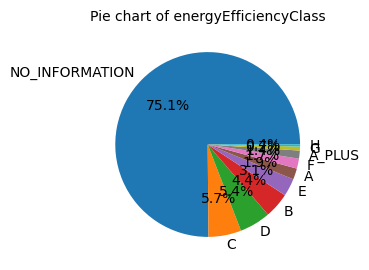

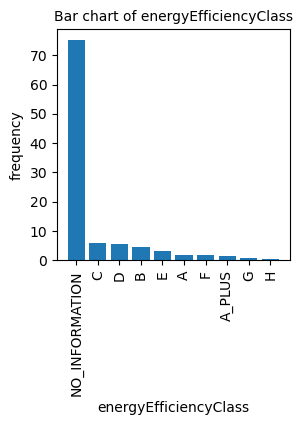

QUANTITATIVE VARIABLES 

serviceCharge


,lower,upper,mid,freq,cum_freq
0,0.0,10.0,5.0,2.633745,2.633745
1,10.0,20.0,15.0,0.021656,2.655400
2,20.0,30.0,25.0,0.173641,2.829041
3,30.0,40.0,35.0,0.725668,3.554709
4,40.0,50.0,45.0,1.512365,5.067074
...,...,...,...,...,...
225,2250.0,2260.0,2255.0,0.000000,99.998425
226,2260.0,2270.0,2265.0,0.000000,99.998425
227,2270.0,2280.0,2275.0,0.000000,99.998425
228,2280.0,2290.0,2285.0,0.000000,99.998425


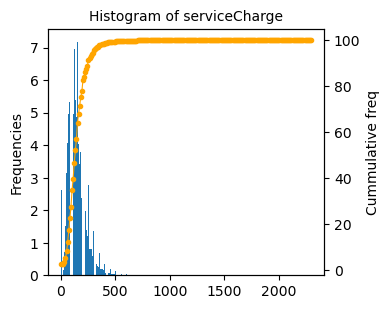

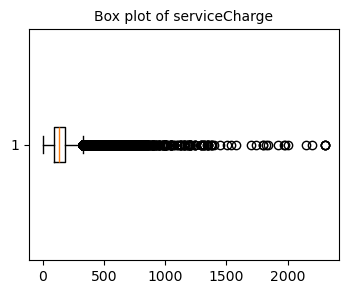

telekomUploadSpeed


,lower,upper,mid,freq,cum_freq
0,0.0,10.0,5.0,16.764380,16.764380
1,10.0,20.0,15.0,12.356825,29.121206
2,20.0,30.0,25.0,0.000000,29.121206
3,30.0,40.0,35.0,0.000000,29.121206
4,40.0,50.0,45.0,70.823276,99.944482
5,50.0,60.0,55.0,0.000000,99.944482
6,60.0,70.0,65.0,0.000000,99.944482
7,70.0,80.0,75.0,0.000000,99.944482
8,80.0,90.0,85.0,0.000000,99.944482
9,90.0,100.0,95.0,0.055518,100.000000


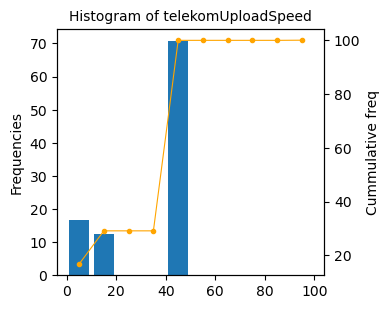

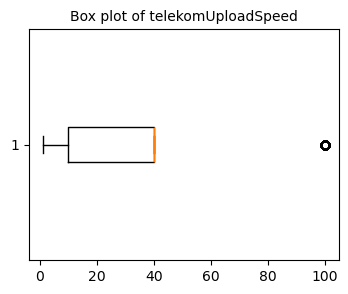

totalRent


,lower,upper,mid,freq,cum_freq
0,380.0,390.0,385.0,10.155016,10.155016
1,390.0,400.0,395.0,1.394243,11.549259
2,400.0,410.0,405.0,1.304076,12.853335
3,410.0,420.0,415.0,1.278089,14.131423
4,420.0,430.0,425.0,1.501341,15.632764
...,...,...,...,...,...
957,9950.0,9960.0,9955.0,0.000000,99.991731
958,9960.0,9970.0,9965.0,0.000000,99.991731
959,9970.0,9980.0,9975.0,0.000000,99.991731
960,9980.0,9990.0,9985.0,0.000000,99.991731


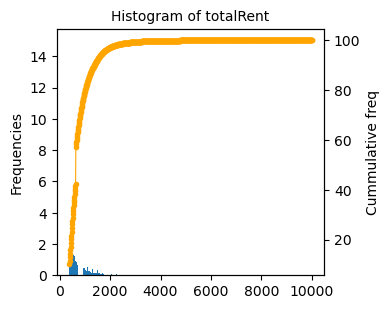

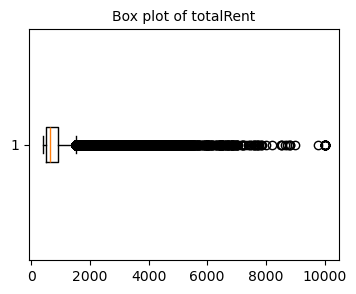

yearConstructed


,lower,upper,mid,freq,cum_freq
0,1950.0,1960.0,1955.0,27.520248,27.520248
1,1960.0,1970.0,1965.0,9.967595,37.487843
2,1970.0,1980.0,1975.0,27.737594,65.225437
3,1980.0,1990.0,1985.0,7.330701,72.556138
4,1990.0,2000.0,1995.0,10.343225,82.899363
5,2000.0,2010.0,2005.0,2.997956,85.897320
6,2010.0,2020.0,2015.0,13.304958,99.202277
7,2020.0,2030.0,2025.0,0.797723,100.000000


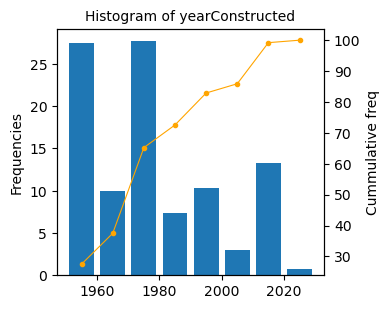

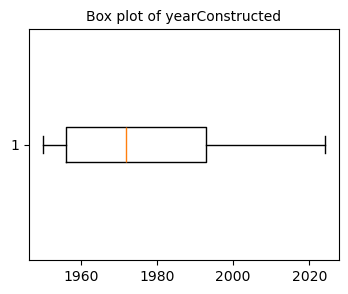

noParkSpaces


,lower,upper,mid,freq,cum_freq
0,0.0,10.0,5.0,100.0,100.0


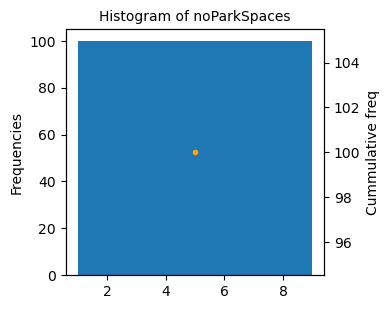

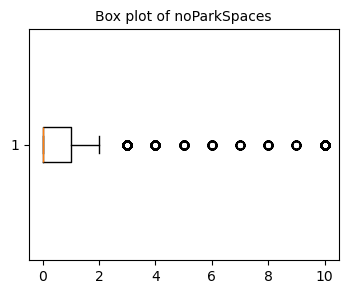

yearConstructedRange


,lower,upper,mid,freq,cum_freq
0,0.0,10.0,5.0,100.0,100.0


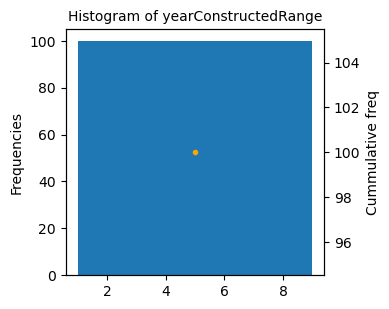

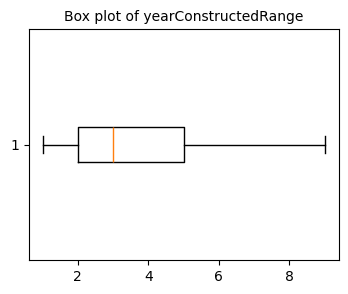

baseRent


,lower,upper,mid,freq,cum_freq
0,0.0,10.0,5.0,0.028349,0.028349
1,10.0,20.0,15.0,0.003150,0.031499
2,20.0,30.0,25.0,0.002362,0.033862
3,30.0,40.0,35.0,0.000787,0.034649
4,40.0,50.0,45.0,0.001181,0.035831
...,...,...,...,...,...
145,1450.0,1460.0,1455.0,0.248058,94.350581
146,1460.0,1470.0,1465.0,0.062211,94.412792
147,1470.0,1480.0,1475.0,0.071267,94.484059
148,1480.0,1490.0,1485.0,0.086623,94.570683


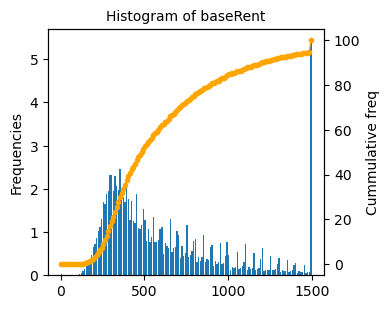

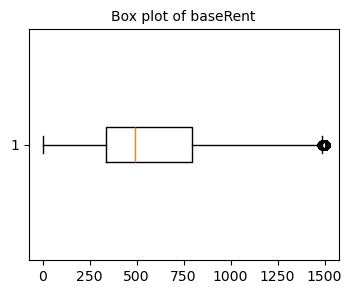

livingSpace


,lower,upper,mid,freq,cum_freq
0,0.0,10.0,5.0,0.010237,0.010237
1,10.0,20.0,15.0,0.618570,0.628807
2,20.0,30.0,25.0,2.631382,3.260189
3,30.0,40.0,35.0,5.577758,8.837947
4,40.0,50.0,45.0,9.703000,18.540947
5,50.0,60.0,55.0,16.807298,35.348246
6,60.0,70.0,65.0,18.361794,53.710040
7,70.0,80.0,75.0,13.663657,67.373697
8,80.0,90.0,85.0,9.850260,77.223957
9,90.0,100.0,95.0,6.642832,83.866789


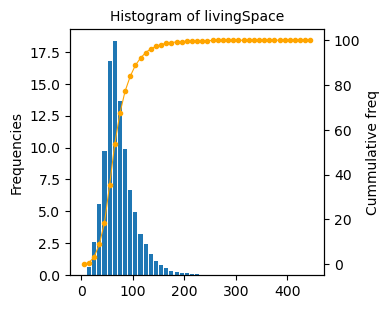

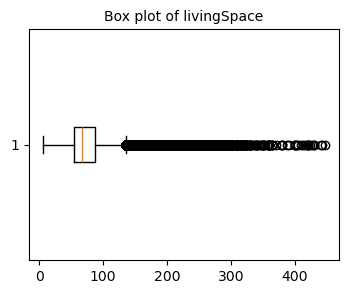

baseRentRange


,lower,upper,mid,freq,cum_freq
0,0.0,10.0,5.0,100.0,100.0


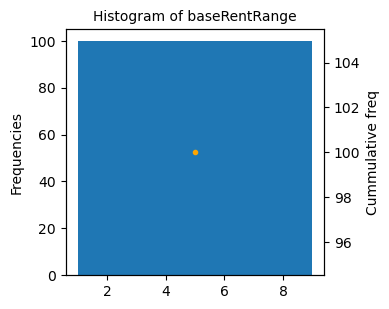

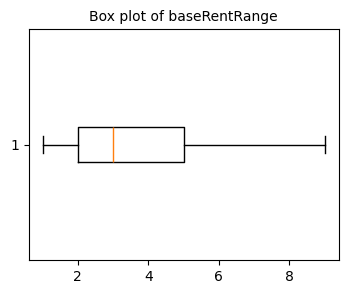

geo_plz


,lower,upper,mid,freq,cum_freq
0,850.0,860.0,855.0,0.000394,0.000394
1,860.0,870.0,865.0,0.000000,0.000394
2,870.0,880.0,875.0,0.000000,0.000394
3,880.0,890.0,885.0,0.000000,0.000394
4,890.0,900.0,895.0,0.000000,0.000394
...,...,...,...,...,...
9910,99950.0,99960.0,99955.0,0.001575,99.917314
9911,99960.0,99970.0,99965.0,0.000000,99.917314
9912,99970.0,99980.0,99975.0,0.077961,99.995275
9913,99980.0,99990.0,99985.0,0.000000,99.995275


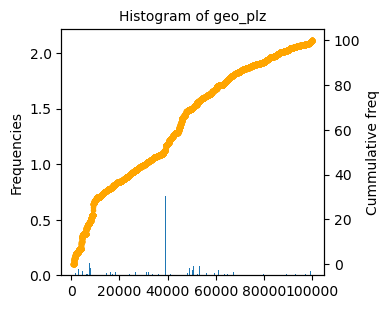

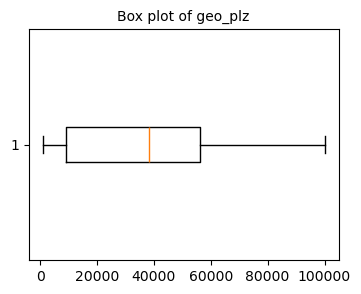

noRooms


,lower,upper,mid,freq,cum_freq
0,0.0,10.0,5.0,100.0,100.0


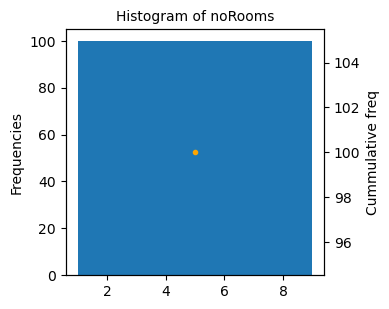

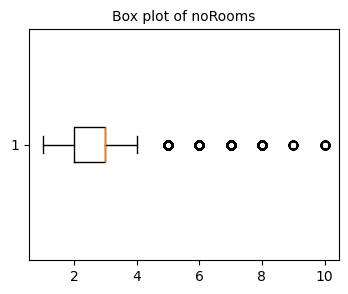

thermalChar


,lower,upper,mid,freq,cum_freq
0,0.0,10.0,5.0,0.088592,0.088592
1,10.0,20.0,15.0,0.692593,0.781185
2,20.0,30.0,25.0,0.931201,1.712387
3,30.0,40.0,35.0,1.116260,2.828647
4,40.0,50.0,45.0,1.668681,4.497328
5,50.0,60.0,55.0,2.790454,7.287783
6,60.0,70.0,65.0,3.857497,11.145279
7,70.0,80.0,75.0,4.934383,16.079662
8,80.0,90.0,85.0,5.545865,21.625527
9,90.0,100.0,95.0,5.773842,27.399369


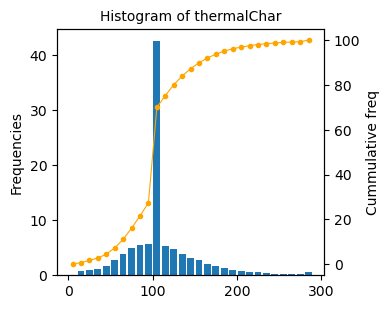

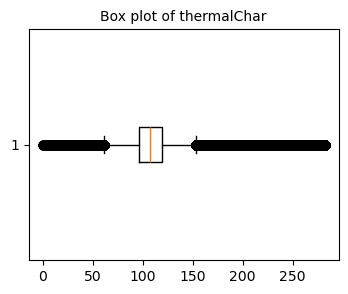

floor


,lower,upper,mid,freq,cum_freq
0,-10.0,0.0,-5.0,0.119698,0.119698
1,0.0,10.0,5.0,99.413323,99.533021
2,10.0,20.0,15.0,0.440204,99.973226
3,20.0,30.0,25.0,0.013781,99.987006
4,30.0,40.0,35.0,0.001575,99.988581
5,40.0,50.0,45.0,0.000787,99.989369
6,50.0,60.0,55.0,0.000000,99.989369
7,60.0,70.0,65.0,0.010631,100.000000


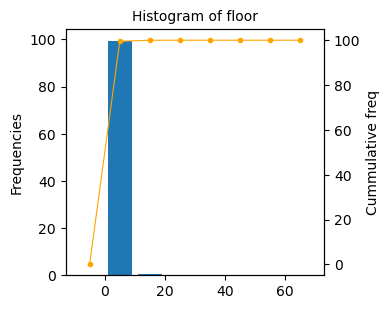

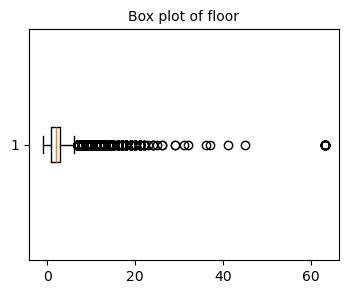

numberOfFloors


,lower,upper,mid,freq,cum_freq
0,0.0,10.0,5.0,98.854996,98.854996
1,10.0,20.0,15.0,1.054443,99.909439
2,20.0,30.0,25.0,0.066936,99.976375
3,30.0,40.0,35.0,0.007875,99.984250
4,40.0,50.0,45.0,0.007875,99.992125
5,50.0,60.0,55.0,0.000394,99.992519
6,60.0,70.0,65.0,0.007481,100.000000


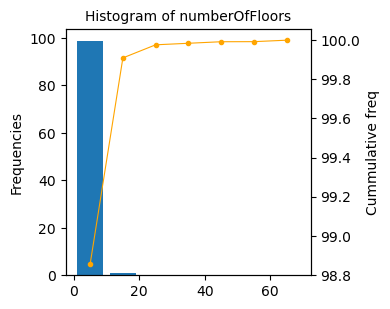

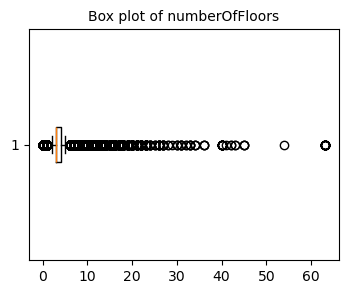

noRoomsRange


,lower,upper,mid,freq,cum_freq
0,0.0,10.0,5.0,100.0,100.0


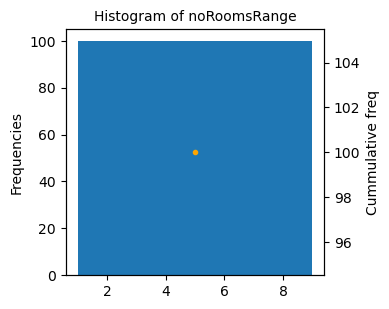

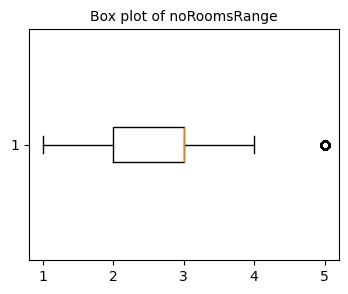

livingSpaceRange


,lower,upper,mid,freq,cum_freq
0,0.0,10.0,5.0,100.0,100.0


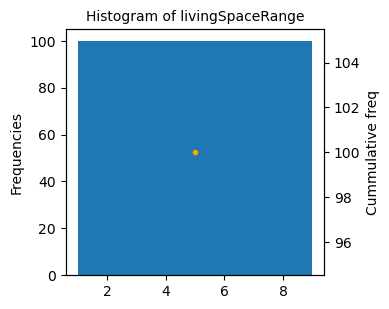

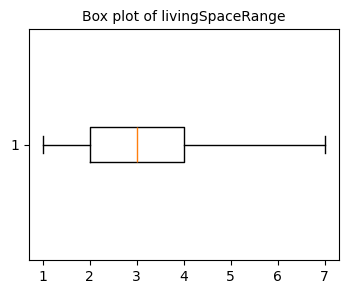

In [143]:
# Running univariate analysis 
univariate_data_analysis(cat_data1, quant_data)

## Bivariate Analysis & EDA

**quantitative variables**

In [ ]:
# Computes the correlation matrix for all numerical variables in the DataFrame, considering only numeric columns
df[quant_vars].corr(numeric_only=True)

,serviceCharge,telekomUploadSpeed,totalRent,yearConstructed,noParkSpaces,yearConstructedRange,baseRent,livingSpace,baseRentRange,geo_plz,noRooms,thermalChar,floor,numberOfFloors,noRoomsRange,livingSpaceRange
serviceCharge,1.000000,0.029092,0.629266,0.201458,0.200194,0.218997,0.589174,0.664334,0.575457,0.125794,0.461079,-0.086561,0.022655,0.036124,0.457626,0.629525
telekomUploadSpeed,0.029092,1.000000,0.035051,0.024214,-0.004740,0.040747,0.048907,0.001485,0.049071,-0.018481,0.000866,-0.021918,0.002534,0.021477,-0.000267,0.003286
totalRent,0.629266,0.035051,1.000000,0.267749,0.218305,0.300612,0.813065,0.663400,0.776736,0.226271,0.421059,-0.124254,0.029796,0.046861,0.412165,0.623532
yearConstructed,0.201458,0.024214,0.267749,1.000000,0.292043,0.976720,0.351313,0.160225,0.352926,0.172391,0.050704,-0.390620,0.006750,0.026723,0.056234,0.177648
noParkSpaces,0.200194,-0.004740,0.218305,0.292043,1.000000,0.293784,0.271718,0.234452,0.275635,0.160180,0.137475,-0.126060,-0.072864,-0.061529,0.133662,0.236316
yearConstructedRange,0.218997,0.040747,0.300612,0.976720,0.293784,1.000000,0.394662,0.179166,0.394021,0.174351,0.060341,-0.398926,-0.012030,0.018799,0.066984,0.198208
baseRent,0.589174,0.048907,0.813065,0.351313,0.271718,0.394662,1.000000,0.709186,0.961213,0.324519,0.466473,-0.167386,-0.001603,0.018639,0.465582,0.714546
livingSpace,0.664334,0.001485,0.663400,0.160225,0.234452,0.179166,0.709186,1.000000,0.696665,0.148412,0.761434,-0.086780,-0.014783,-0.057236,0.754801,0.950541
baseRentRange,0.575457,0.049071,0.776736,0.352926,0.275635,0.394021,0.961213,0.696665,1.000000,0.352511,0.466107,-0.158803,-0.017805,0.002083,0.465861,0.710000
geo_plz,0.125794,-0.018481,0.226271,0.172391,0.160180,0.174351,0.324519,0.148412,0.352511,1.000000,0.080151,0.029568,-0.086098,-0.100872,0.059304,0.160747


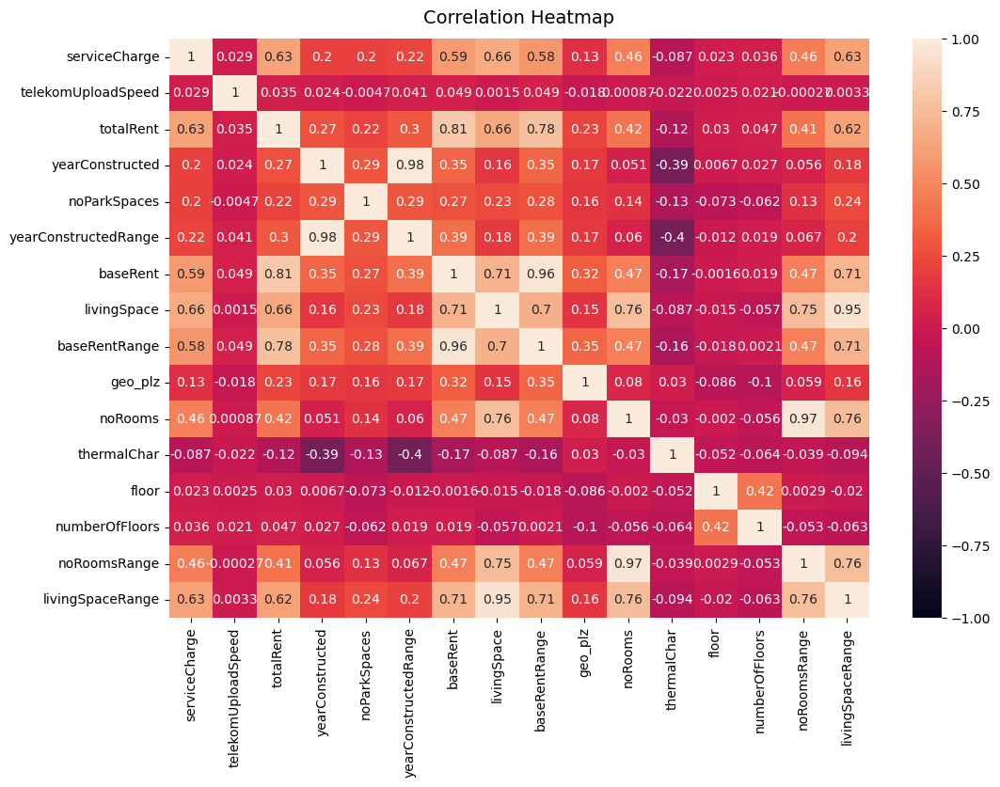

In [ ]:
# Creates a heatmap to visualize the correlation matrix of numerical variables
# Sets the color range from -1 to 1 and annotates the correlations on the heatmap
plt.figure(figsize=(12, 8)) 
sns.heatmap(df[quant_vars].corr(numeric_only=True), vmin=-1, vmax=1, annot=True).set_title('Correlation Heatmap', fontdict={'fontsize':14}, pad=12);


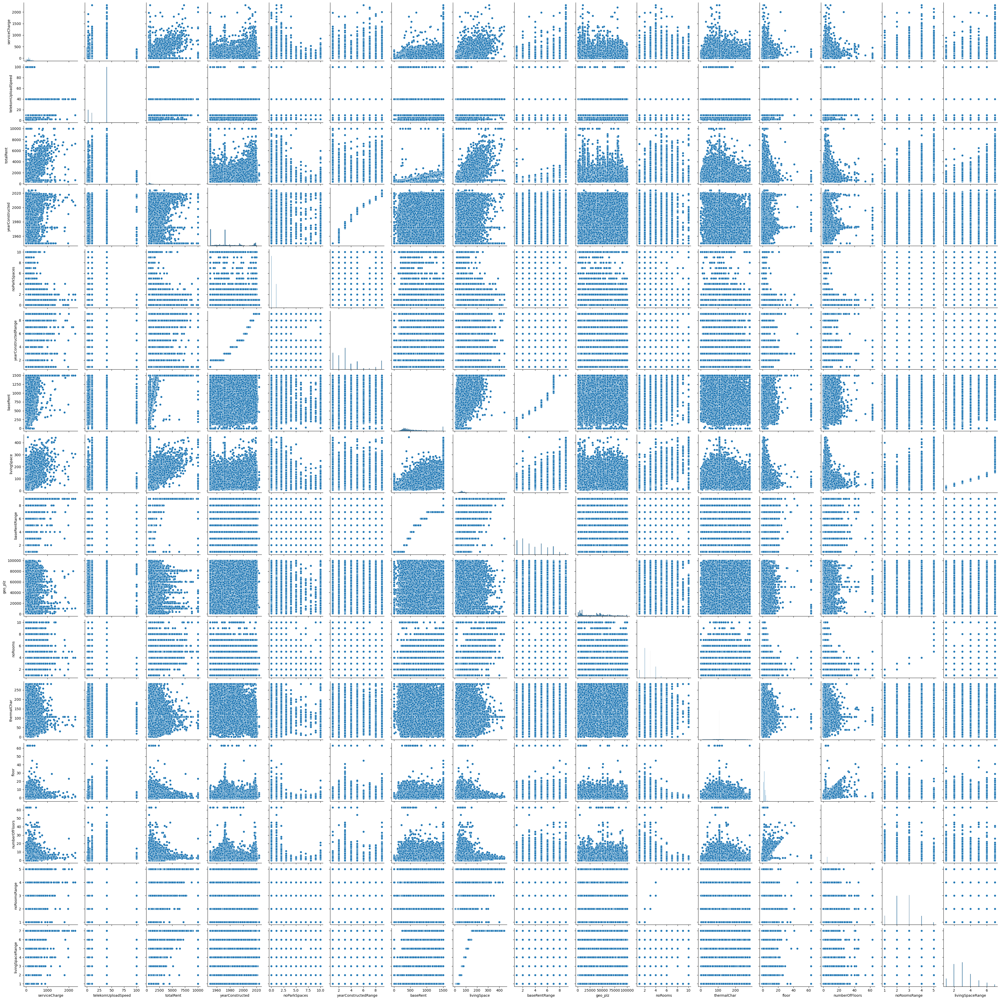

In [157]:
# Generates pairwise scatter plots for all numerical variables to visualize their relationships and distributions
sns.pairplot(df[quant_vars]);

In [ ]:
# Iterates over all pairs of numerical columns in 'quant_data' to calculate and display their correlation and p-value.
for q, quant1 in enumerate(quant_data.columns):
    for quant2 in quant_data.columns[q+1:]:
        correlation = round(quant_data[quant1].corr(quant_data[quant2]), 4)
        formula = f'{quant1} ~ {quant2}'
        model = ols(formula, data=quant_data).fit()
        p_value = model.f_pvalue
        print(f'{quant1} and {quant2}')
        print(f'Correlation coefficient {correlation}  - ', f'p_value: {p_value}', '\n')

serviceCharge and telekomUploadSpeed
Correlation coefficient 0.0291  -  p_value: 1.0922318331581802e-48 

serviceCharge and totalRent
Correlation coefficient 0.6293  -  p_value: 0.0 

serviceCharge and yearConstructed
Correlation coefficient 0.2015  -  p_value: 0.0 

serviceCharge and noParkSpaces
Correlation coefficient 0.2002  -  p_value: 0.0 

serviceCharge and yearConstructedRange
Correlation coefficient 0.219  -  p_value: 0.0 

serviceCharge and baseRent
Correlation coefficient 0.5892  -  p_value: 0.0 

serviceCharge and livingSpace
Correlation coefficient 0.6643  -  p_value: 0.0 

serviceCharge and baseRentRange
Correlation coefficient 0.5755  -  p_value: 0.0 

serviceCharge and geo_plz
Correlation coefficient 0.1258  -  p_value: 0.0 

serviceCharge and noRooms
Correlation coefficient 0.4611  -  p_value: 0.0 

serviceCharge and thermalChar
Correlation coefficient -0.0866  -  p_value: 0.0 

serviceCharge and floor
Correlation coefficient 0.0227  -  p_value: 3.374030022063165e-30 


**Regional Features**

In [ ]:
# Groups the data by the 'regio1' column and calculates the mean of 'totalRent' for each region
mean_rent_regio1 = df.groupby('regio1').mean('totalRent')[['totalRent']].sort_values(by='totalRent',ascending=False).reset_index() 
mean_rent_regio1

,regio1,totalRent
0,Hamburg,1338.862143
1,Berlin,1326.529259
2,Bayern,1126.951422
3,Hessen,1092.533120
4,Baden_Württemberg,1046.157281
5,Rheinland_Pfalz,816.793912
6,Schleswig_Holstein,804.250780
7,Bremen,762.623936
8,Nordrhein_Westfalen,759.158350
9,Niedersachsen,746.878385


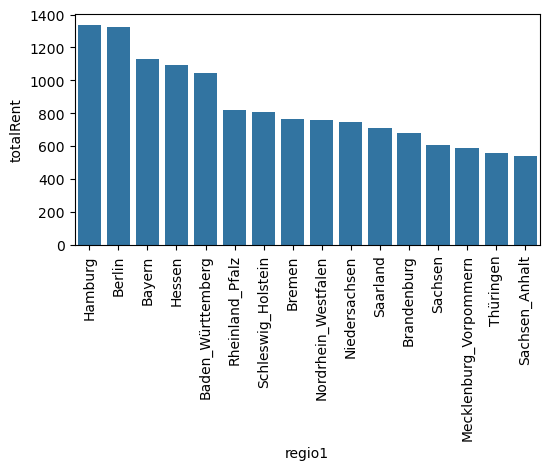

In [ ]:
# Creates a bar plot to visualize the average 'totalRent' by 'regio1'
plt.figure(figsize=(6,3))
sns.barplot(data=mean_rent_regio1, x=mean_rent_regio1['regio1'],y=mean_rent_regio1['totalRent'])
plt.xticks(rotation=90);

In [ ]:
# Counts the occurrences of each rental offer in 'regio1'
count_regio1 = df.value_counts('regio1').reset_index()
count_regio1

,regio1,count
0,Nordrhein_Westfalen,60050
1,Sachsen,55831
2,Bayern,20017
3,Sachsen_Anhalt,19475
4,Hessen,16510
5,Niedersachsen,15181
6,Baden_Württemberg,14516
7,Berlin,10065
8,Thüringen,7822
9,Rheinland_Pfalz,7625


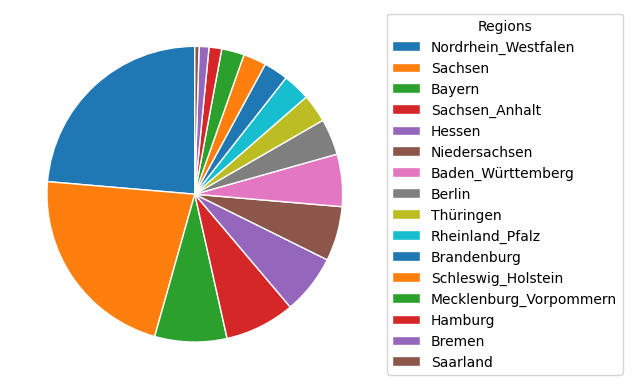

In [ ]:
# Create a pie chart to visualize the distribution of listings by 'regio1'
plt.pie(count_regio1['count'], labels=None, startangle=90, wedgeprops={'linewidth': 1, 'edgecolor': 'white'})
plt.legend(count_regio1['regio1'],title="Regions", loc="center left", bbox_to_anchor=(1, 0.5), fontsize=10);

In [ ]:
# Groups the data by 'regio2' and calculates the mean of 'totalRent' for each city
df.groupby('regio2').mean('totalRent')[['totalRent']].sort_values(by='totalRent',ascending=False).reset_index() 

,regio2,totalRent
0,München,1808.259995
1,Starnberg_Kreis,1542.790381
2,Frankfurt_am_Main,1519.389682
3,Freiburg_im_Breisgau,1460.217581
4,München_Kreis,1454.551551
...,...,...
414,Prignitz_Kreis,476.838841
415,Plauen,468.176149
416,Kyffhäuserkreis,466.654600
417,Uecker_Randow_Kreis,456.652205


There seems to be a higher rent in urban cities such as Munchen and Frankfurt, even though the amount of listings in these cities is lower than others. This may be a driver for the price. 

**quantitative + categorical variables**

serviceCharge vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,1.361527e+08,9.076846e+06,1266.851282,0.0
Residual,253957.0,1.819573e+09,7.164887e+03,NaN,NaN


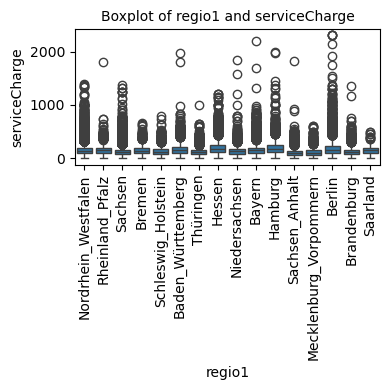

serviceCharge vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,1.000053e+08,7.692715e+06,1052.763131,0.0
Residual,253959.0,1.855721e+09,7.307166e+03,NaN,NaN


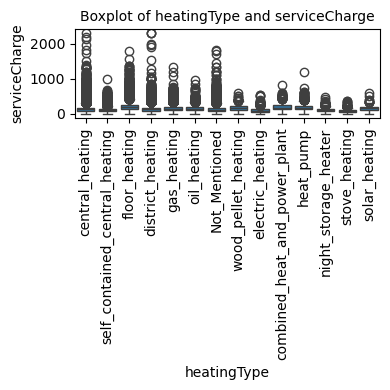

serviceCharge vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,7.163056e+06,3.581528e+06,466.805926,4.369972e-203
Residual,253970.0,1.948563e+09,7.672413e+03,NaN,NaN


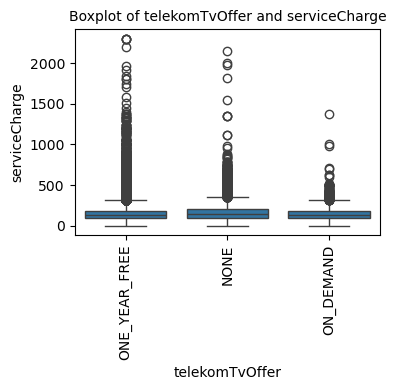

serviceCharge vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,1.189230e+08,1.321367e+07,1826.97011,0.0
Residual,253963.0,1.836803e+09,7.232560e+03,NaN,NaN


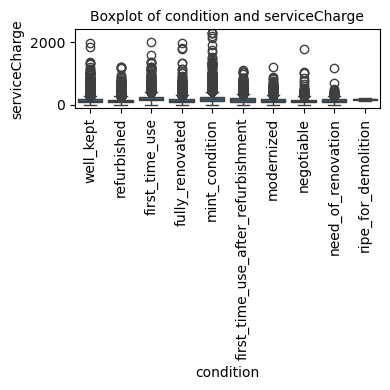

serviceCharge vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,1.909729e+08,9.548643e+07,13741.690716,0.0
Residual,253970.0,1.764753e+09,6.948667e+03,NaN,NaN


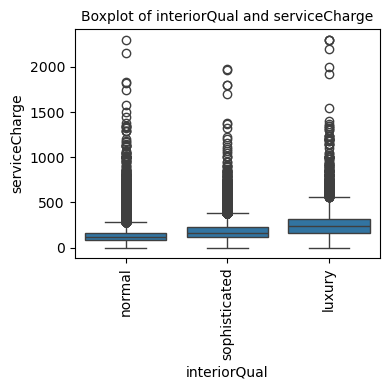

serviceCharge vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,1.270963e+06,635481.562264,82.577121,1.408859e-36
Residual,253970.0,1.954455e+09,7695.612979,NaN,NaN


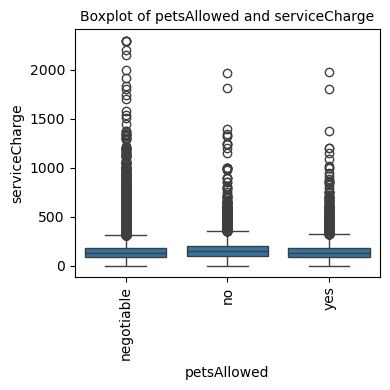

serviceCharge vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,1.110608e+08,1.234009e+07,1698.914064,0.0
Residual,253963.0,1.844665e+09,7.263518e+03,NaN,NaN


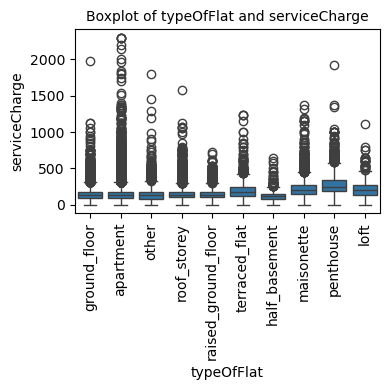

serviceCharge vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,2.492256e+07,2.769174e+06,364.235801,0.0
Residual,253963.0,1.930803e+09,7.602695e+03,NaN,NaN


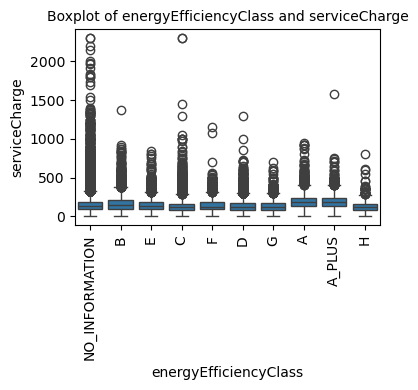

telekomUploadSpeed vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,3.930829e+05,26205.527753,105.389311,0.0
Residual,253957.0,6.314755e+07,248.654512,NaN,NaN


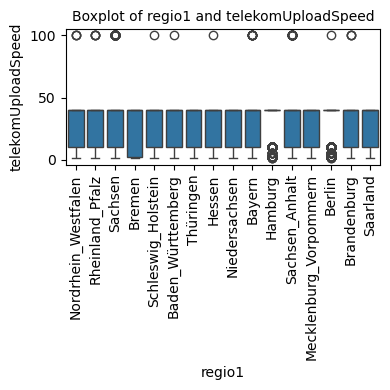

telekomUploadSpeed vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,1.782238e+05,13709.519276,54.948283,4.842632e-144
Residual,253959.0,6.336241e+07,249.498592,NaN,NaN


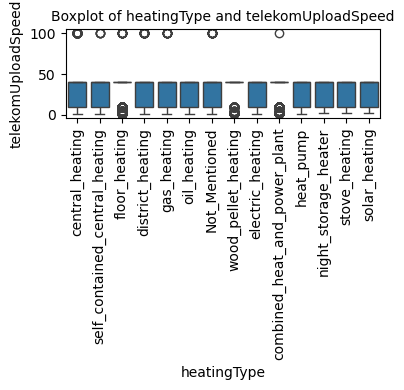

telekomUploadSpeed vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,3.636703e+06,1.818352e+06,7709.122553,0.0
Residual,253970.0,5.990393e+07,2.358701e+02,NaN,NaN


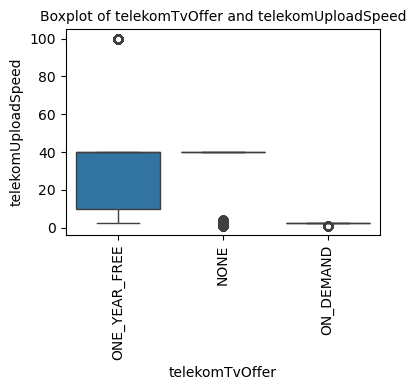

telekomUploadSpeed vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,4.460998e+05,49566.648656,199.511644,0.0
Residual,253963.0,6.309454e+07,248.439879,NaN,NaN


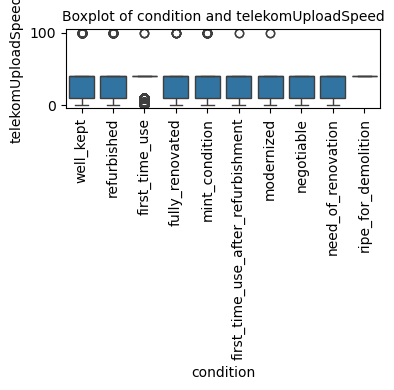

telekomUploadSpeed vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,3.539347e+04,17696.732557,70.772726,1.872224e-31
Residual,253970.0,6.350524e+07,250.050177,NaN,NaN


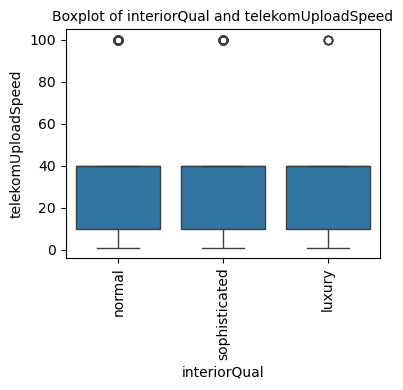

telekomUploadSpeed vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,2.614718e+04,13073.591312,52.27626,2.001615e-23
Residual,253970.0,6.351449e+07,250.086584,NaN,NaN


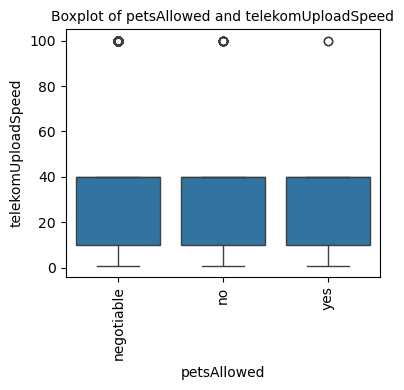

telekomUploadSpeed vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,2.772955e+04,3081.061446,12.319946,9.838910e-20
Residual,253963.0,6.351291e+07,250.087246,NaN,NaN


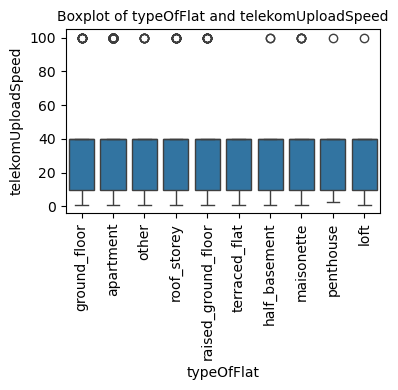

telekomUploadSpeed vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,1.121063e+05,12456.252362,49.873885,6.074917e-91
Residual,253963.0,6.342853e+07,249.755006,NaN,NaN


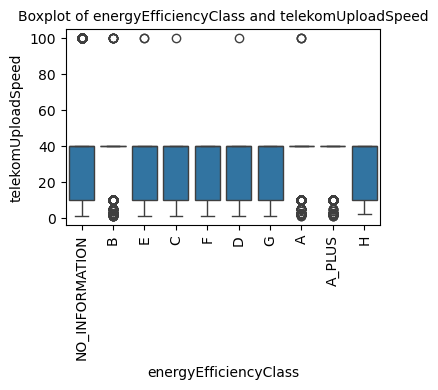

totalRent vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,1.271067e+10,8.473777e+08,4078.523327,0.0
Residual,253957.0,5.276358e+10,2.077658e+05,NaN,NaN


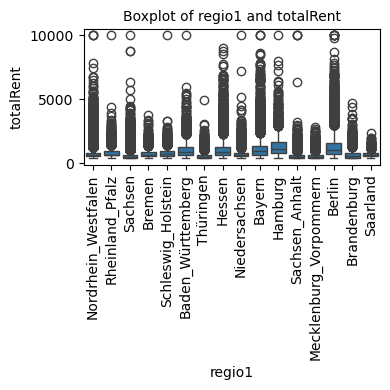

totalRent vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,4.607747e+09,3.544421e+08,1478.871808,0.0
Residual,253959.0,6.086650e+10,2.396706e+05,NaN,NaN


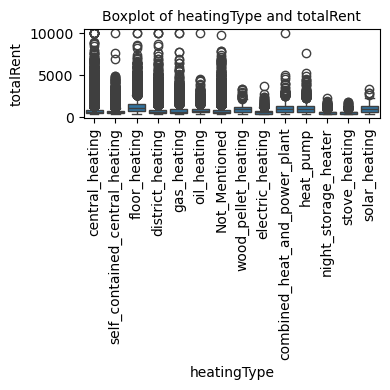

totalRent vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,4.825343e+08,2.412672e+08,942.80668,0.0
Residual,253970.0,6.499171e+10,2.559031e+05,NaN,NaN


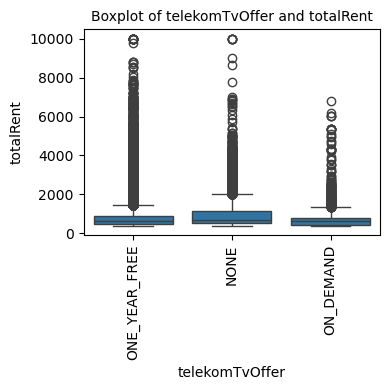

totalRent vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,7.645041e+09,8.494490e+08,3730.444116,0.0
Residual,253963.0,5.782921e+10,2.277072e+05,NaN,NaN


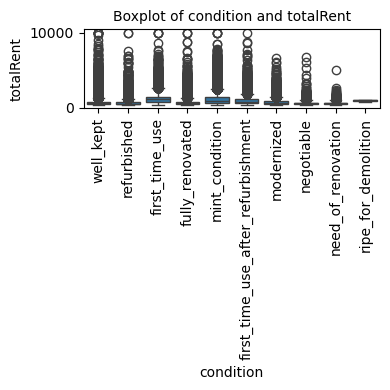

totalRent vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,1.166041e+10,5.830207e+09,27515.189335,0.0
Residual,253970.0,5.381383e+10,2.118905e+05,NaN,NaN


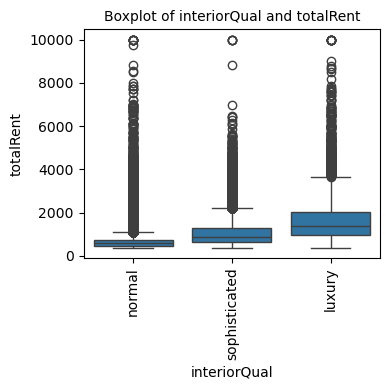

totalRent vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,4.179882e+08,2.089941e+08,815.882065,0.0
Residual,253970.0,6.505626e+10,2.561573e+05,NaN,NaN


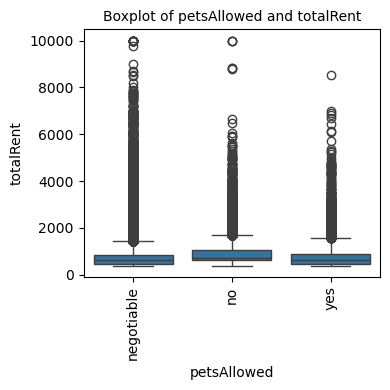

totalRent vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,4.538082e+09,5.042313e+08,2101.47944,0.0
Residual,253963.0,6.093616e+10,2.399411e+05,NaN,NaN


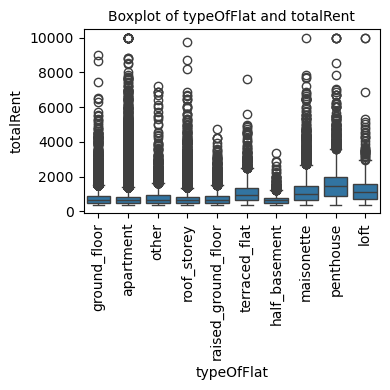

totalRent vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,1.470606e+09,1.634006e+08,648.364865,0.0
Residual,253963.0,6.400364e+10,2.520196e+05,NaN,NaN


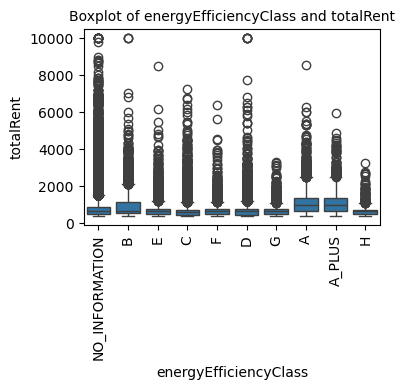

yearConstructed vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,7.731665e+06,515444.321938,1113.536066,0.0
Residual,253957.0,1.175541e+08,462.889652,NaN,NaN


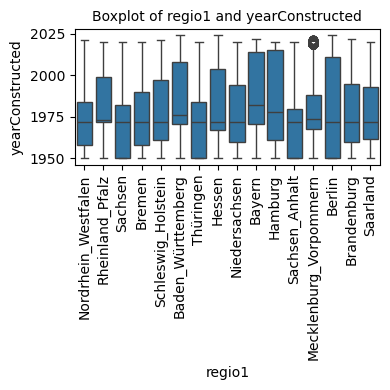

yearConstructed vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,2.278551e+07,1.752731e+06,4342.643592,0.0
Residual,253959.0,1.025002e+08,4.036093e+02,NaN,NaN


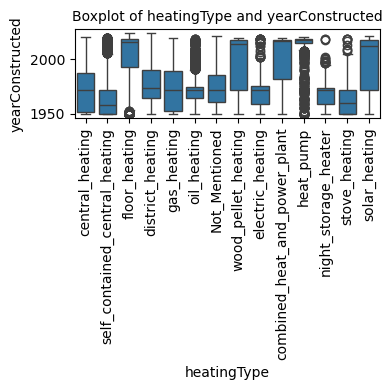

yearConstructed vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,5.176448e+06,2.588224e+06,5472.776227,0.0
Residual,253970.0,1.201093e+08,4.729271e+02,NaN,NaN


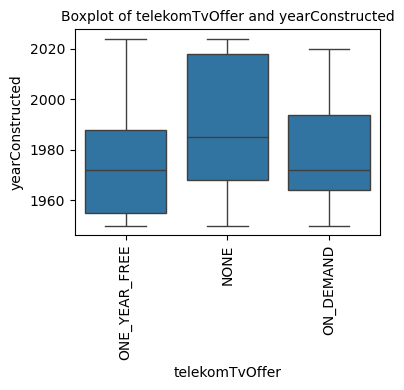

yearConstructed vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,4.078722e+07,4.531913e+06,13620.811201,0.0
Residual,253963.0,8.449851e+07,3.327198e+02,NaN,NaN


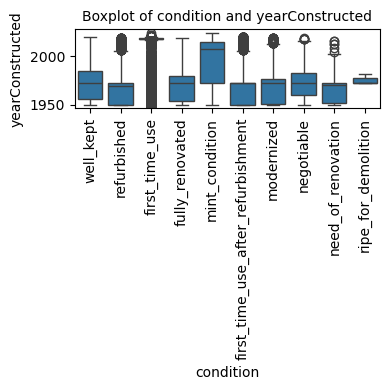

yearConstructed vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,1.260702e+07,6.303509e+06,14207.671093,0.0
Residual,253970.0,1.126787e+08,4.436694e+02,NaN,NaN


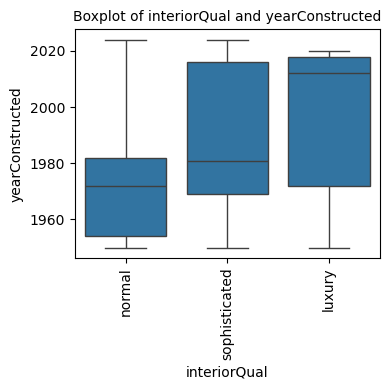

yearConstructed vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,1.326780e+06,663390.136587,1359.169228,0.0
Residual,253970.0,1.239590e+08,488.085018,NaN,NaN


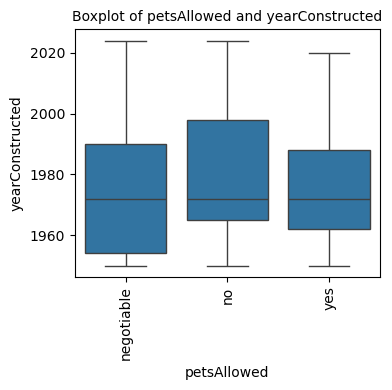

yearConstructed vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,4.308565e+06,478729.492081,1004.979545,0.0
Residual,253963.0,1.209772e+08,476.357449,NaN,NaN


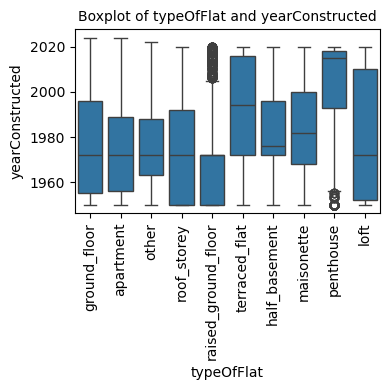

yearConstructed vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,1.712624e+07,1.902915e+06,4468.124313,0.0
Residual,253963.0,1.081595e+08,4.258868e+02,NaN,NaN


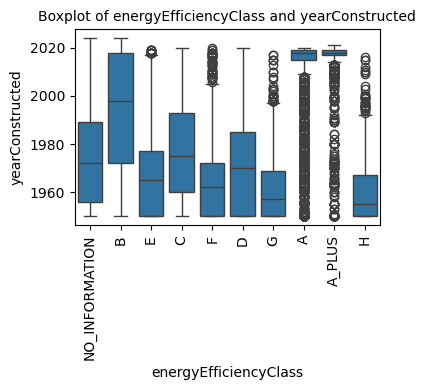

noParkSpaces vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,6221.814241,414.787616,746.100115,0.0
Residual,253957.0,141185.099037,0.555941,NaN,NaN


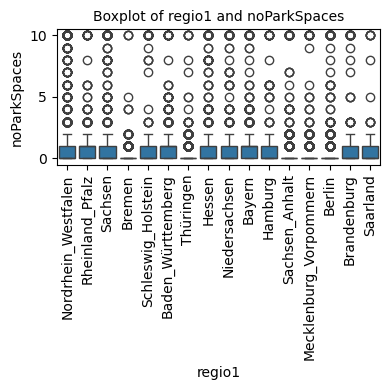

noParkSpaces vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,7448.831294,572.987023,1039.705669,0.0
Residual,253959.0,139958.081984,0.551105,NaN,NaN


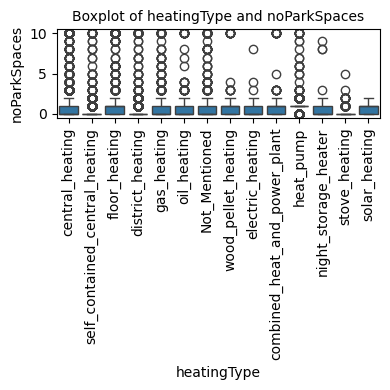

noParkSpaces vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,1710.506056,855.253028,1490.830252,0.0
Residual,253970.0,145696.407222,0.573676,NaN,NaN


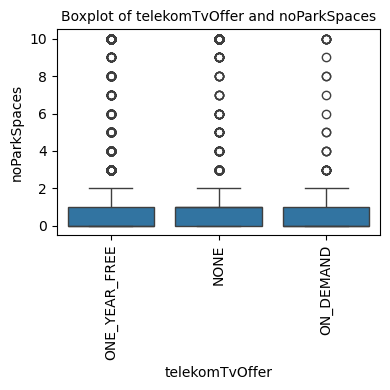

noParkSpaces vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,8515.470300,946.163367,1730.059692,0.0
Residual,253963.0,138891.442978,0.546896,NaN,NaN


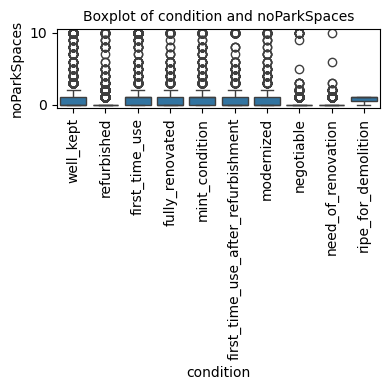

noParkSpaces vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,8146.465698,4073.232849,7428.375857,0.0
Residual,253970.0,139260.447580,0.548334,NaN,NaN


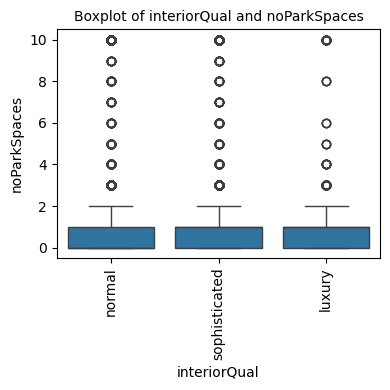

noParkSpaces vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,1666.926932,833.463466,1452.413451,0.0
Residual,253970.0,145739.986346,0.573847,NaN,NaN


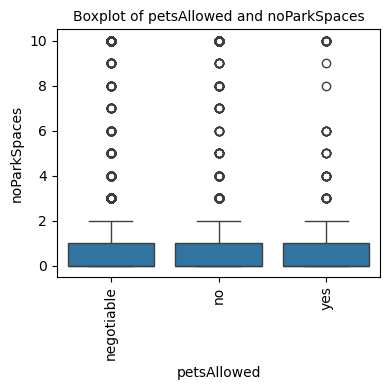

noParkSpaces vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,3708.120375,412.013375,728.16306,0.0
Residual,253963.0,143698.792903,0.565826,NaN,NaN


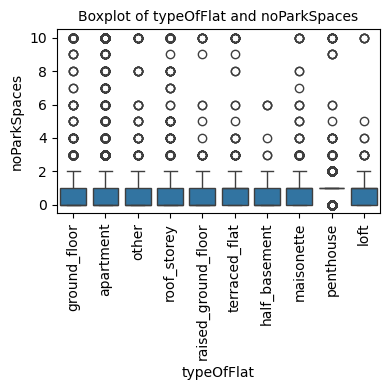

noParkSpaces vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,2589.442864,287.715874,504.560577,0.0
Residual,253963.0,144817.470414,0.570231,NaN,NaN


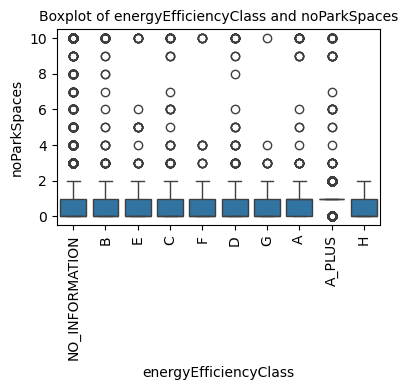

yearConstructedRange vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,1.039191e+05,6927.937262,1204.773579,0.0
Residual,253957.0,1.460356e+06,5.750406,NaN,NaN


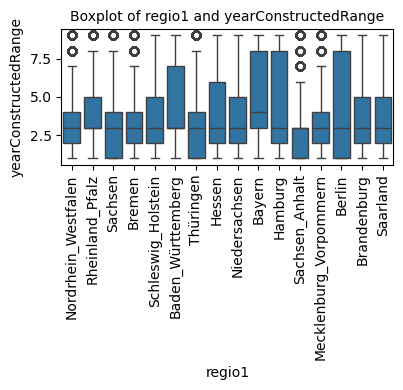

yearConstructedRange vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,3.414423e+05,26264.795665,5454.697025,0.0
Residual,253959.0,1.222833e+06,4.815079,NaN,NaN


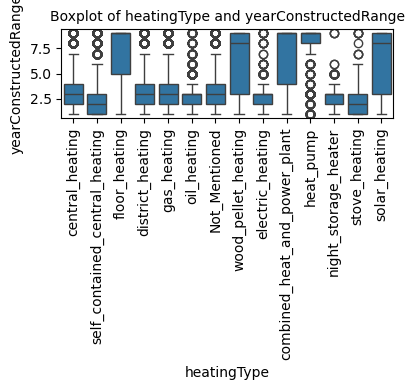

yearConstructedRange vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,8.165200e+04,40825.999826,6993.402706,0.0
Residual,253970.0,1.482623e+06,5.837788,NaN,NaN


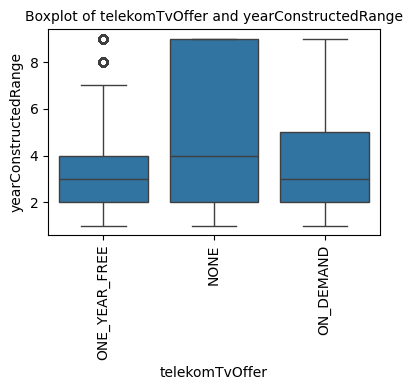

yearConstructedRange vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,647851.444207,71983.493801,19948.3584,0.0
Residual,253963.0,916423.480544,3.608492,NaN,NaN


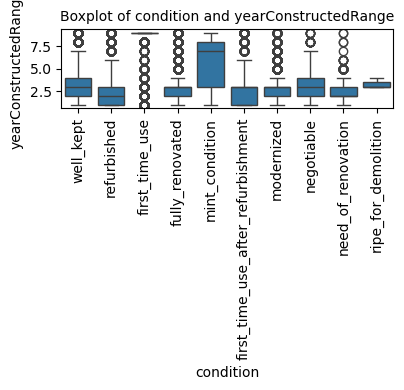

yearConstructedRange vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,1.975767e+05,98788.343950,18357.582557,0.0
Residual,253970.0,1.366698e+06,5.381337,NaN,NaN


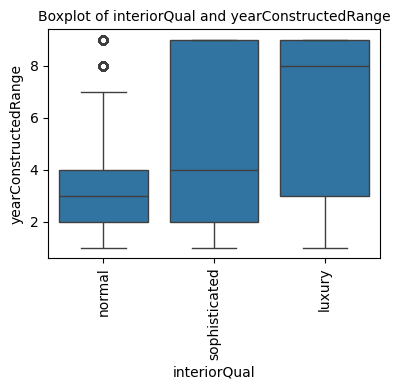

yearConstructedRange vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,1.512749e+04,7563.743806,1240.01368,0.0
Residual,253970.0,1.549147e+06,6.099726,NaN,NaN


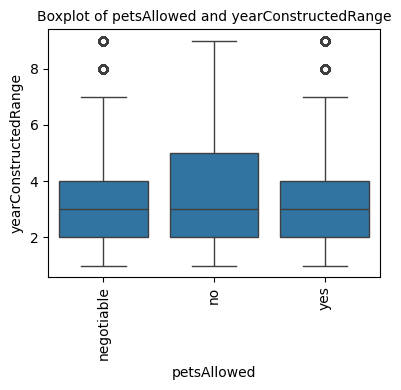

yearConstructedRange vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,6.050857e+04,6723.174484,1135.440726,0.0
Residual,253963.0,1.503766e+06,5.921203,NaN,NaN


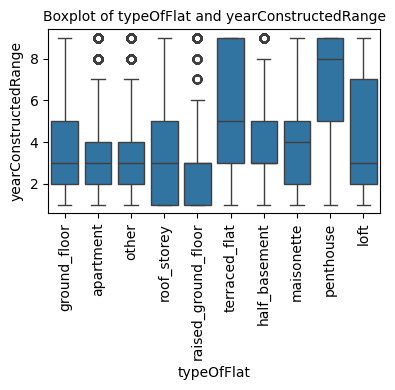

yearConstructedRange vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,2.636759e+05,29297.326978,5720.777238,0.0
Residual,253963.0,1.300599e+06,5.121214,NaN,NaN


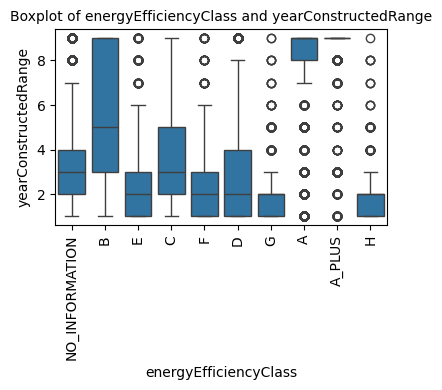

baseRent vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,1.003144e+10,6.687629e+08,7300.307561,0.0
Residual,253957.0,2.326437e+10,9.160750e+04,NaN,NaN


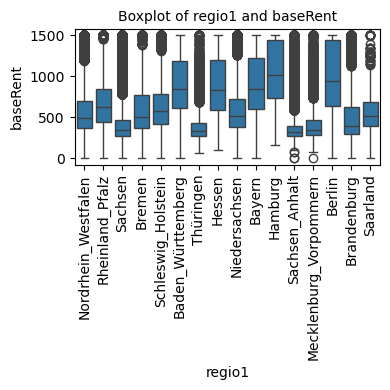

baseRent vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,3.541181e+09,2.723985e+08,2324.950956,0.0
Residual,253959.0,2.975463e+10,1.171631e+05,NaN,NaN


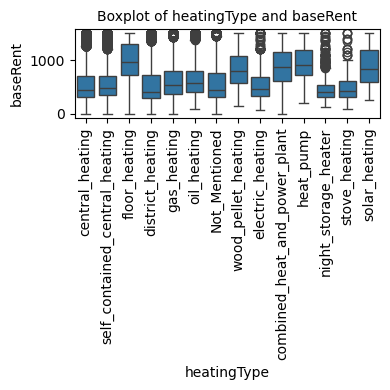

baseRent vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,4.815631e+08,2.407816e+08,1863.559277,0.0
Residual,253970.0,3.281425e+10,1.292052e+05,NaN,NaN


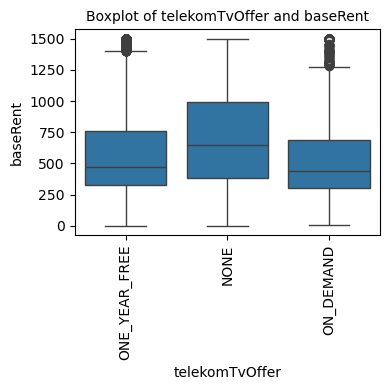

baseRent vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,6.464813e+09,7.183126e+08,6799.03291,0.0
Residual,253963.0,2.683100e+10,1.056492e+05,NaN,NaN


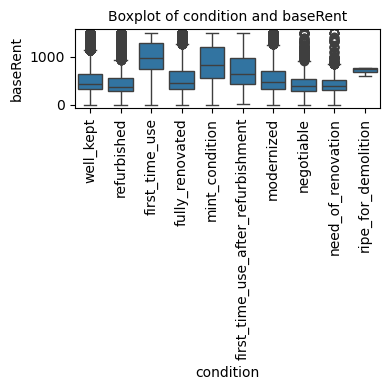

baseRent vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,8.003848e+09,4.001924e+09,40185.441584,0.0
Residual,253970.0,2.529196e+10,9.958641e+04,NaN,NaN


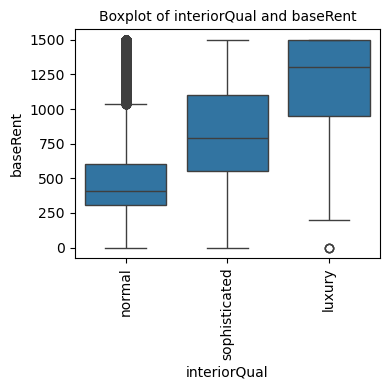

baseRent vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,6.817177e+08,3.408588e+08,2654.31039,0.0
Residual,253970.0,3.261409e+10,1.284171e+05,NaN,NaN


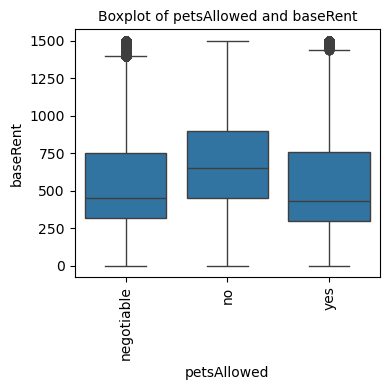

baseRent vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,2.991485e+09,3.323873e+08,2785.545378,0.0
Residual,253963.0,3.030432e+10,1.193257e+05,NaN,NaN


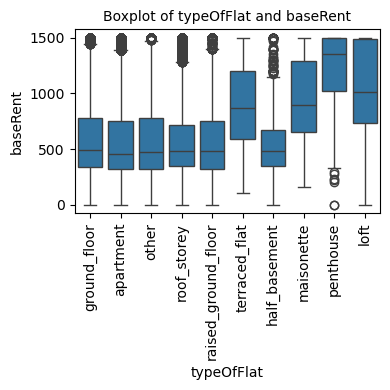

baseRent vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,1.513374e+09,1.681526e+08,1343.652402,0.0
Residual,253963.0,3.178244e+10,1.251459e+05,NaN,NaN


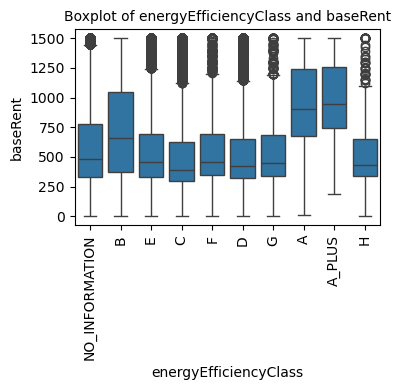

livingSpace vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,1.251240e+07,834160.306394,880.52262,0.0
Residual,253957.0,2.405854e+08,947.346823,NaN,NaN


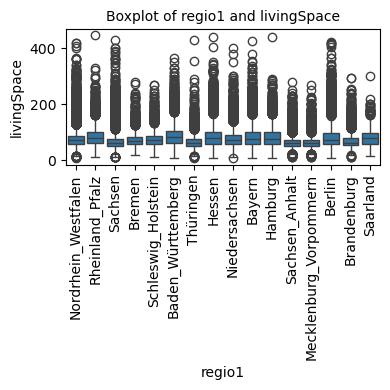

livingSpace vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,1.032144e+07,793956.861193,830.527822,0.0
Residual,253959.0,2.427763e+08,955.966603,NaN,NaN


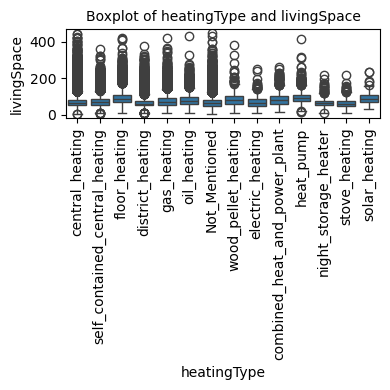

livingSpace vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,9.158924e+05,457946.224167,461.193356,1.172500e-200
Residual,253970.0,2.521819e+08,992.959284,NaN,NaN


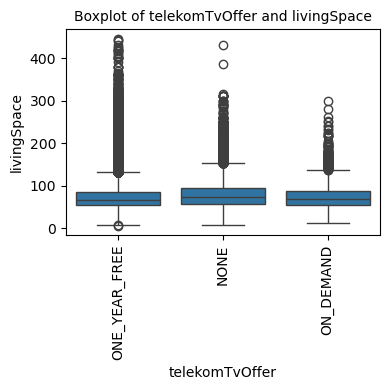

livingSpace vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,1.260654e+07,1.400727e+06,1479.192215,0.0
Residual,253963.0,2.404912e+08,9.469538e+02,NaN,NaN


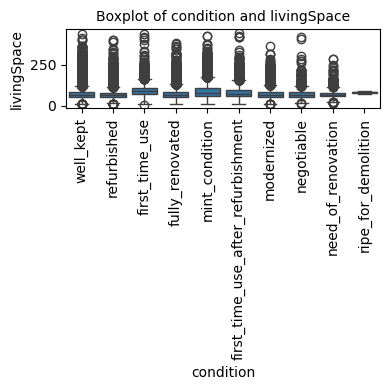

livingSpace vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,2.548964e+07,1.274482e+07,14220.940114,0.0
Residual,253970.0,2.276081e+08,8.962008e+02,NaN,NaN


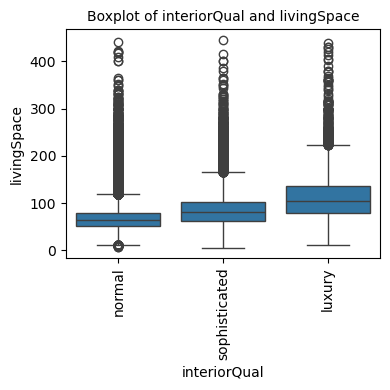

livingSpace vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,8.660318e+04,43301.591670,43.465693,1.337579e-19
Residual,253970.0,2.530112e+08,996.224588,NaN,NaN


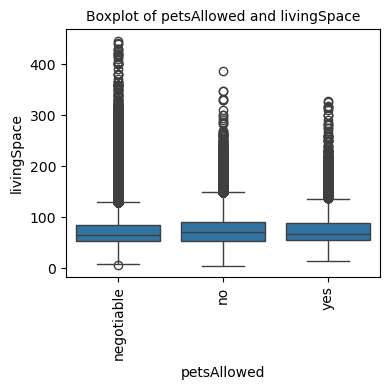

livingSpace vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,2.479431e+07,2.754923e+06,3064.555349,0.0
Residual,253963.0,2.283035e+08,8.989634e+02,NaN,NaN


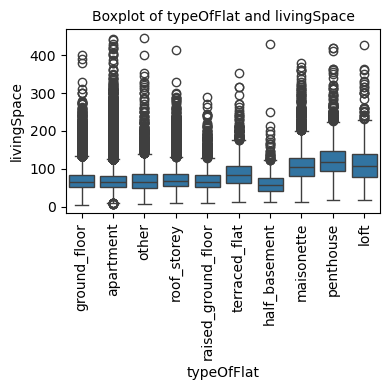

livingSpace vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,2.844895e+06,316099.495510,320.785841,0.0
Residual,253963.0,2.502529e+08,985.391046,NaN,NaN


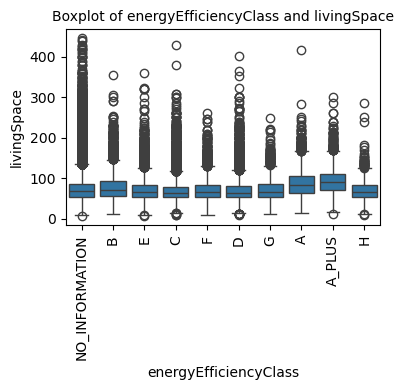

baseRentRange vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,405866.105534,27057.740369,8198.367577,0.0
Residual,253957.0,838154.974943,3.300381,NaN,NaN


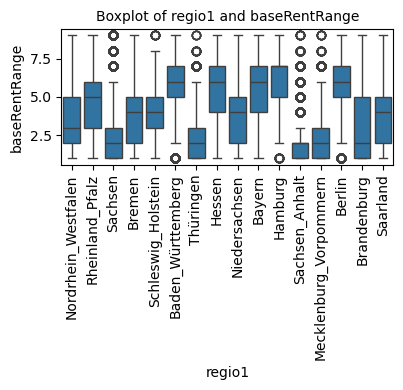

baseRentRange vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,1.306618e+05,10050.904370,2292.626979,0.0
Residual,253959.0,1.113359e+06,4.384012,NaN,NaN


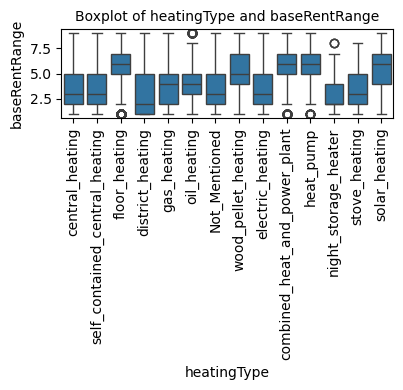

baseRentRange vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,1.851749e+04,9258.745793,1918.757065,0.0
Residual,253970.0,1.225504e+06,4.825387,NaN,NaN


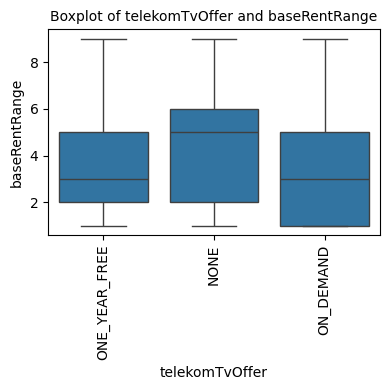

baseRentRange vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,2.393814e+05,26597.929311,6723.693887,0.0
Residual,253963.0,1.004640e+06,3.955851,NaN,NaN


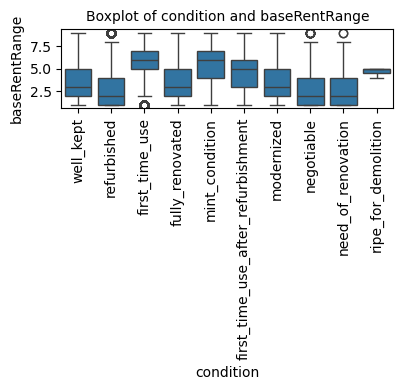

baseRentRange vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,293361.341474,146680.670737,39185.934166,0.0
Residual,253970.0,950659.739003,3.743197,NaN,NaN


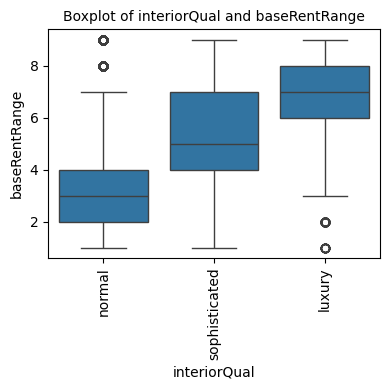

baseRentRange vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,3.617665e+04,18088.324083,3803.380257,0.0
Residual,253970.0,1.207844e+06,4.755855,NaN,NaN


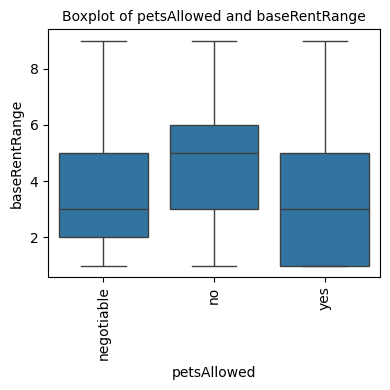

baseRentRange vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,9.691955e+04,10768.838856,2384.171365,0.0
Residual,253963.0,1.147102e+06,4.516806,NaN,NaN


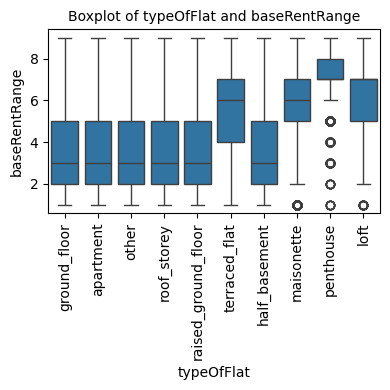

baseRentRange vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,5.602118e+04,6224.575339,1330.649795,0.0
Residual,253963.0,1.188000e+06,4.677846,NaN,NaN


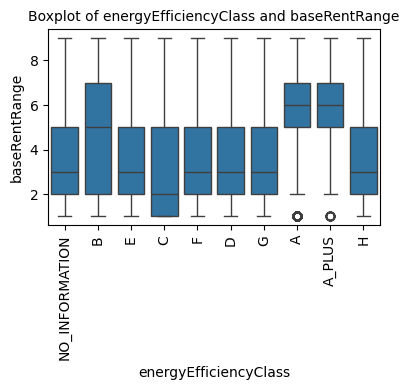

geo_plz vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,1.654798e+14,1.103198e+13,96236.315842,0.0
Residual,253957.0,2.911219e+13,1.146343e+08,NaN,NaN


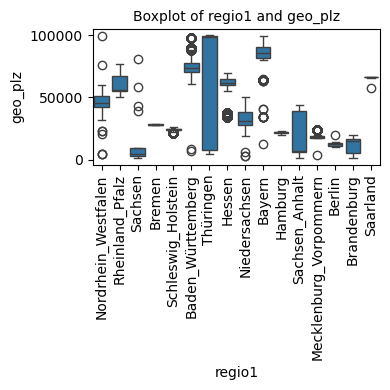

geo_plz vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,7.646648e+12,5.882037e+11,799.055257,0.0
Residual,253959.0,1.869453e+14,7.361239e+08,NaN,NaN


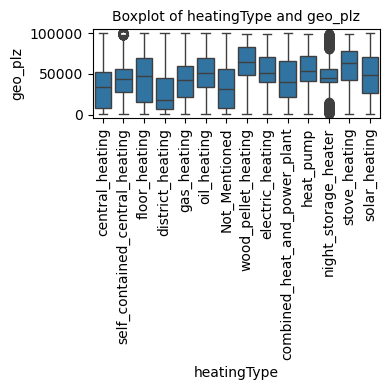

geo_plz vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,1.831602e+11,9.158008e+10,119.637561,1.165542e-52
Residual,253970.0,1.944088e+14,7.654793e+08,NaN,NaN


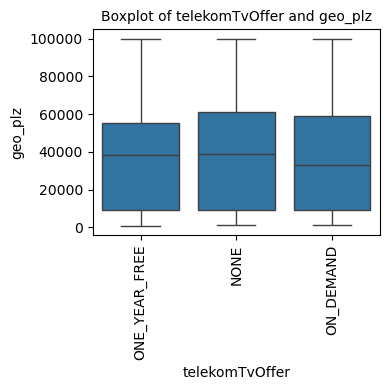

geo_plz vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,9.118429e+12,1.013159e+12,1387.286161,0.0
Residual,253963.0,1.854735e+14,7.303171e+08,NaN,NaN


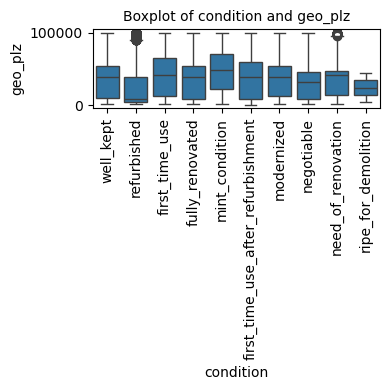

geo_plz vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,6.084176e+12,3.042088e+12,4098.499802,0.0
Residual,253970.0,1.885078e+14,7.422443e+08,NaN,NaN


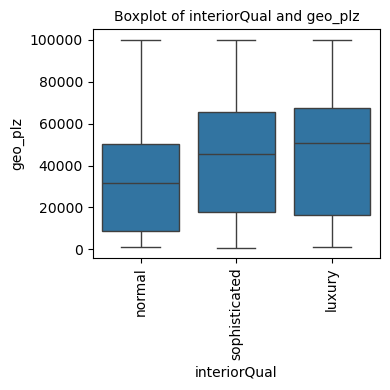

geo_plz vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,1.656155e+13,8.280775e+12,11812.973067,0.0
Residual,253970.0,1.780304e+14,7.009899e+08,NaN,NaN


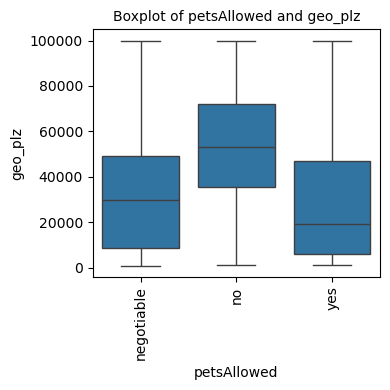

geo_plz vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,3.312347e+12,3.680386e+11,488.646894,0.0
Residual,253963.0,1.912796e+14,7.531790e+08,NaN,NaN


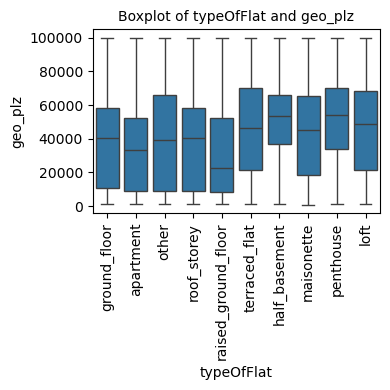

geo_plz vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,2.511990e+12,2.791100e+11,369.031783,0.0
Residual,253963.0,1.920800e+14,7.563305e+08,NaN,NaN


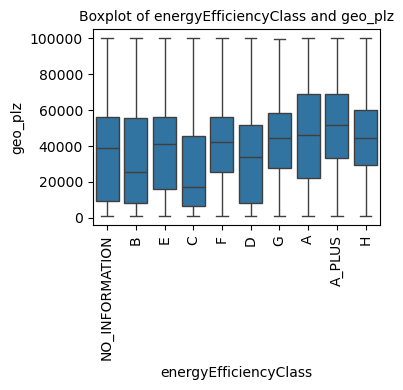

noRooms vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,3327.294071,221.819605,228.685057,0.0
Residual,253957.0,246332.848259,0.969979,NaN,NaN


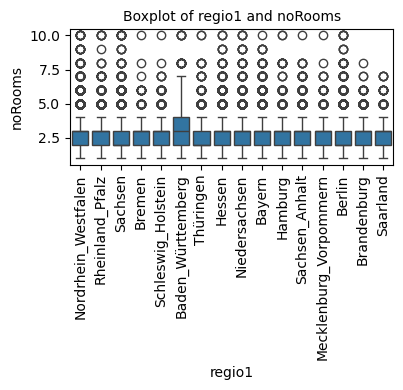

noRooms vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,3005.43047,231.186959,238.033194,0.0
Residual,253959.0,246654.71186,0.971238,NaN,NaN


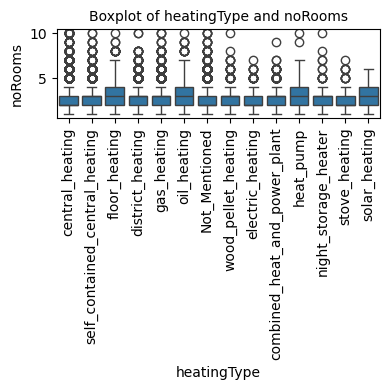

noRooms vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,249.350915,124.675458,126.954515,7.796463e-56
Residual,253970.0,249410.791415,0.982048,NaN,NaN


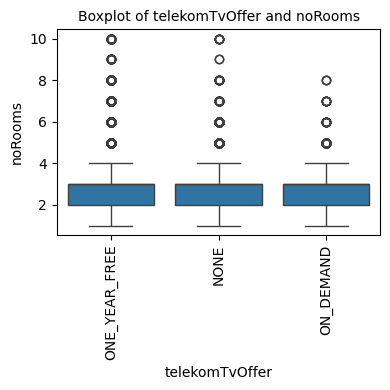

noRooms vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,2711.833621,301.314847,309.873847,0.0
Residual,253963.0,246948.308709,0.972379,NaN,NaN


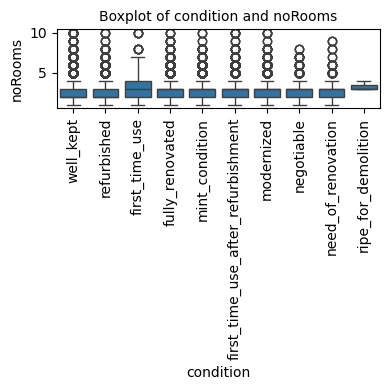

noRooms vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,5363.568653,2681.784327,2787.975104,0.0
Residual,253970.0,244296.573677,0.961911,NaN,NaN


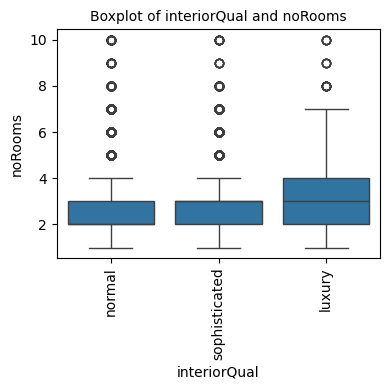

noRooms vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,351.122908,175.561454,178.84368,2.420029e-78
Residual,253970.0,249309.019422,0.981648,NaN,NaN


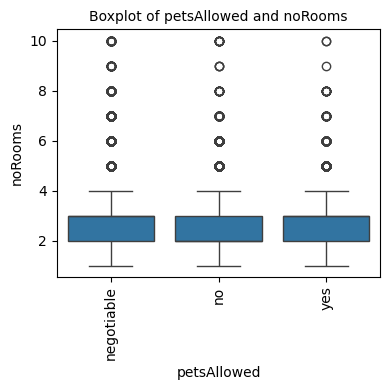

noRooms vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,8908.604891,989.844988,1044.163644,0.0
Residual,253963.0,240751.537439,0.947979,NaN,NaN


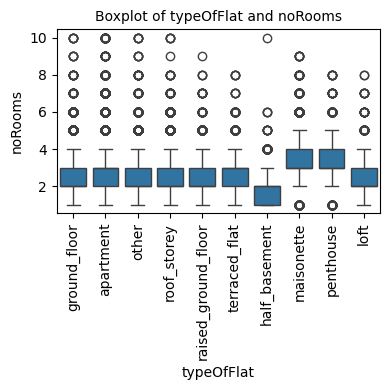

noRooms vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,500.752293,55.639144,56.711825,4.357964e-104
Residual,253963.0,249159.390037,0.981085,NaN,NaN


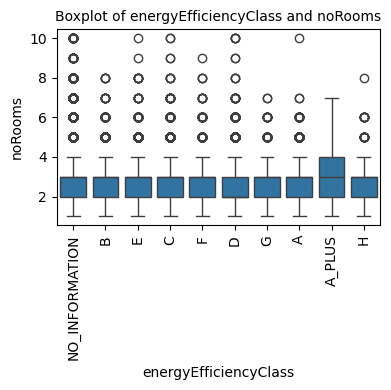

thermalChar vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,1.199425e+07,799616.711089,510.339821,0.0
Residual,253957.0,3.979079e+08,1566.831899,NaN,NaN


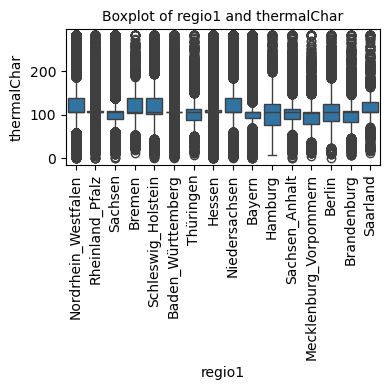

thermalChar vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,3.358802e+07,2.583694e+06,1743.628939,0.0
Residual,253959.0,3.763142e+08,1.481791e+03,NaN,NaN


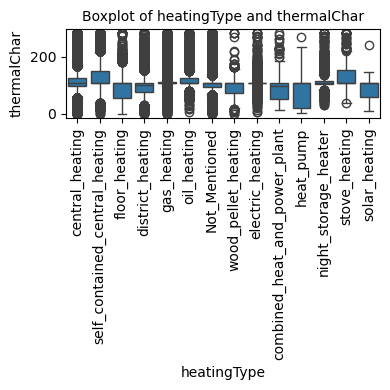

thermalChar vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,4.654756e+06,2.327378e+06,1458.576193,0.0
Residual,253970.0,4.052474e+08,1.595651e+03,NaN,NaN


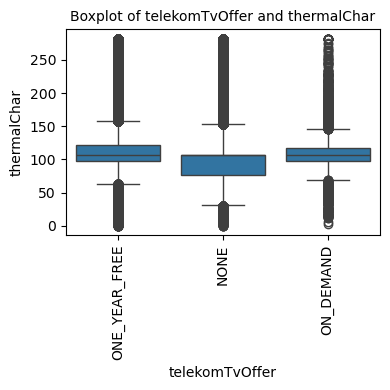

thermalChar vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,3.823344e+07,4.248160e+06,2902.787882,0.0
Residual,253963.0,3.716687e+08,1.463476e+03,NaN,NaN


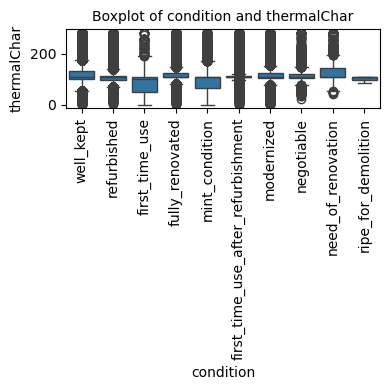

thermalChar vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,1.379671e+07,6.898355e+06,4423.001521,0.0
Residual,253970.0,3.961055e+08,1.559655e+03,NaN,NaN


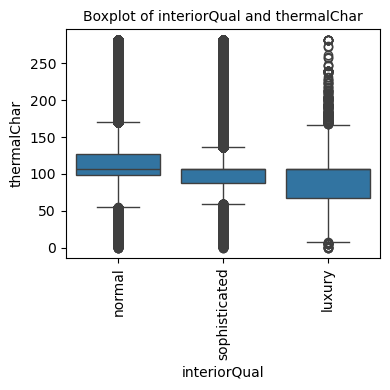

thermalChar vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,8.398791e+04,41993.956335,26.024235,5.000071e-12
Residual,253970.0,4.098182e+08,1613.648034,NaN,NaN


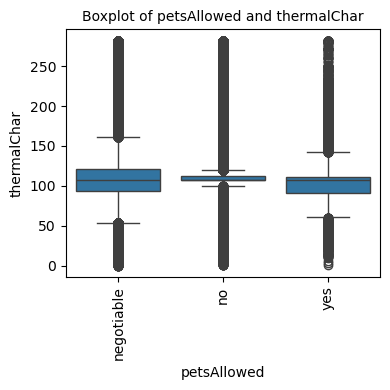

thermalChar vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,3.618188e+06,402020.899624,251.298195,0.0
Residual,253963.0,4.062840e+08,1599.776310,NaN,NaN


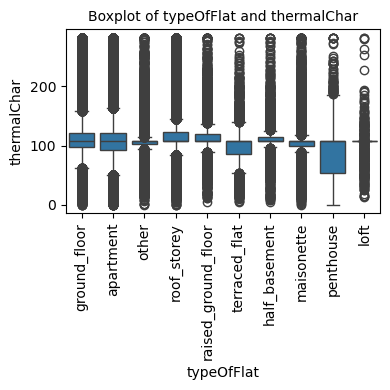

thermalChar vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,1.466620e+08,1.629578e+07,15721.473897,0.0
Residual,253963.0,2.632402e+08,1.036530e+03,NaN,NaN


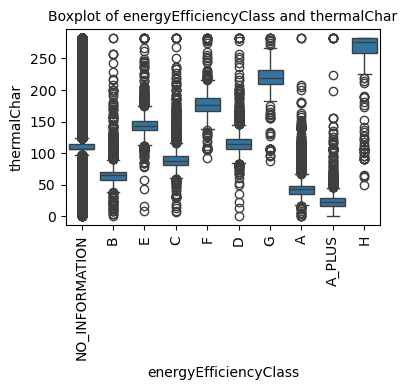

floor vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,14820.772318,988.051488,371.322013,0.0
Residual,253957.0,675754.688940,2.660902,NaN,NaN


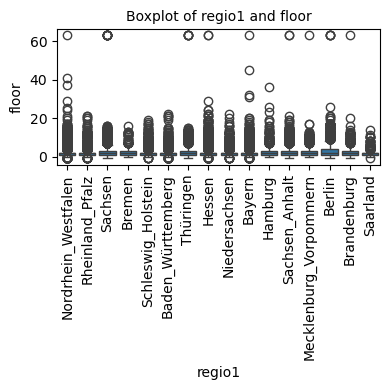

floor vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,13902.065857,1069.389681,401.347439,0.0
Residual,253959.0,676673.395401,2.664499,NaN,NaN


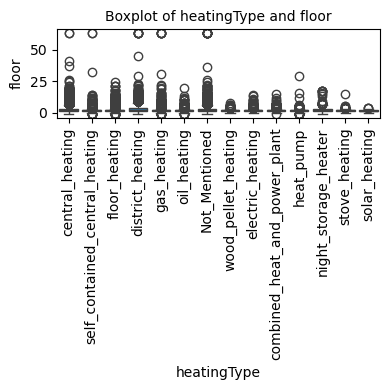

floor vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,322.527471,161.263735,59.33499,1.726473e-26
Residual,253970.0,690252.933787,2.717852,NaN,NaN


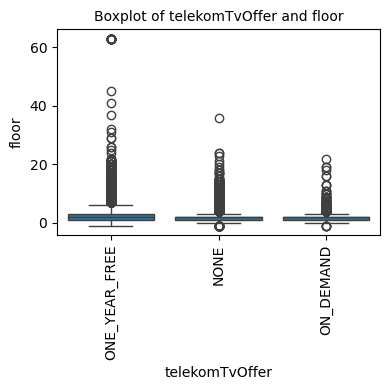

floor vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,1514.444515,168.271613,62.018838,2.658316e-114
Residual,253963.0,689061.016743,2.713234,NaN,NaN


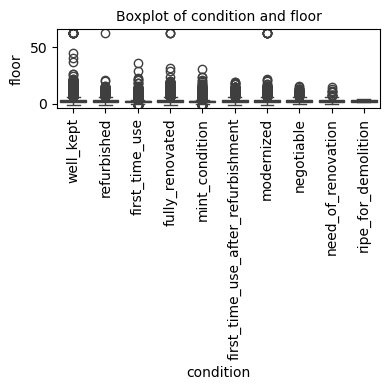

floor vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,2143.564425,1071.782212,395.392093,3.549592e-172
Residual,253970.0,688431.896833,2.710682,NaN,NaN


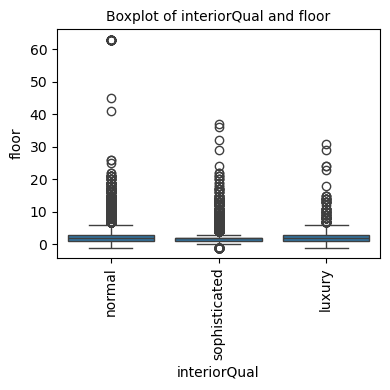

floor vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,3049.620514,1524.810257,563.260372,8.318694e-245
Residual,253970.0,687525.840744,2.707114,NaN,NaN


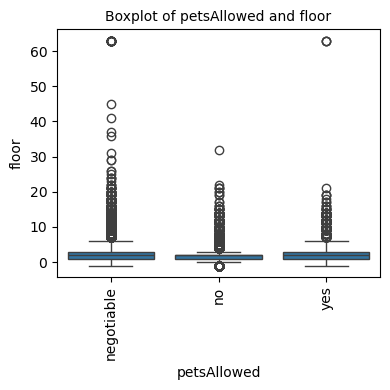

floor vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,68488.739048,7609.859894,3106.677541,0.0
Residual,253963.0,622086.722210,2.449517,NaN,NaN


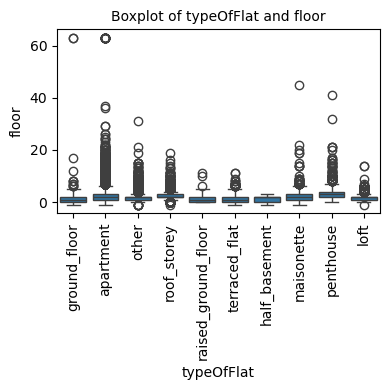

floor vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,4532.033491,503.559277,186.410101,0.0
Residual,253963.0,686043.427766,2.701352,NaN,NaN


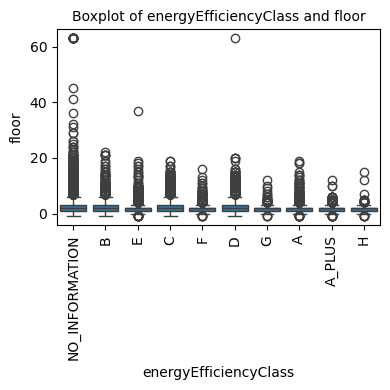

numberOfFloors vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,24302.156505,1620.143767,576.364196,0.0
Residual,253957.0,713866.082048,2.810972,NaN,NaN


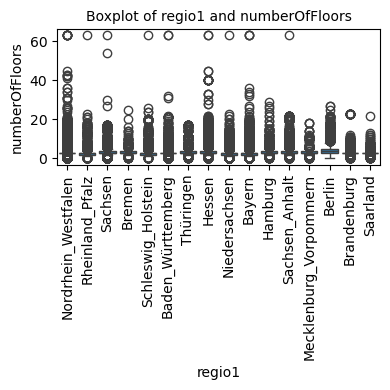

numberOfFloors vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,18686.357025,1437.412079,507.370295,0.0
Residual,253959.0,719481.881528,2.833063,NaN,NaN


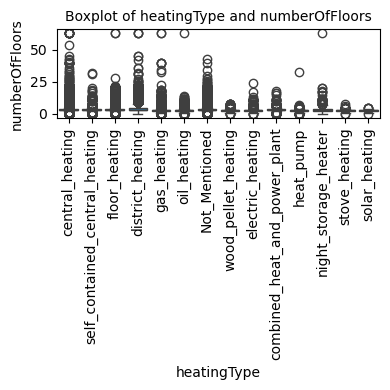

numberOfFloors vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,165.217357,82.608679,28.428239,4.520168e-13
Residual,253970.0,738003.021196,2.905867,NaN,NaN


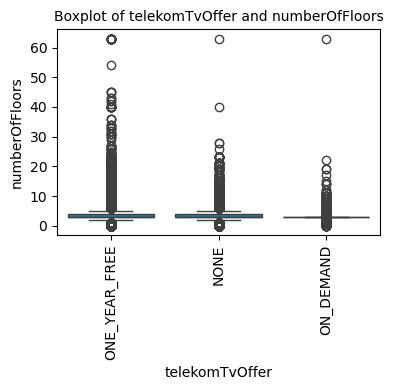

numberOfFloors vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,2981.643939,331.293771,114.442185,1.650261e-215
Residual,253963.0,735186.594614,2.894857,NaN,NaN


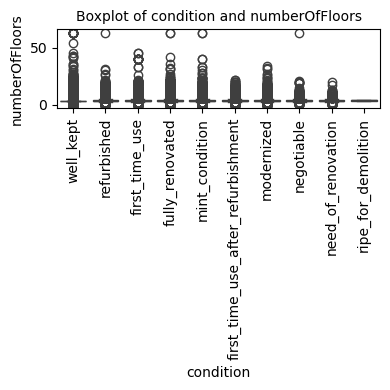

numberOfFloors vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,494.569368,247.284684,85.136414,1.091727e-37
Residual,253970.0,737673.669185,2.904570,NaN,NaN


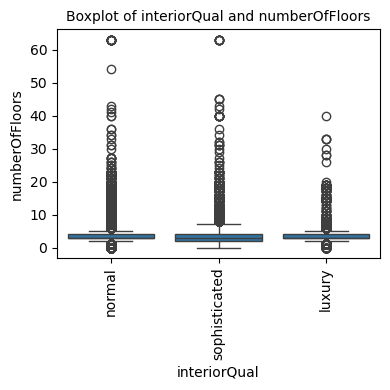

numberOfFloors vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,3901.587312,1950.793656,674.745427,5.464861e-293
Residual,253970.0,734266.651241,2.891155,NaN,NaN


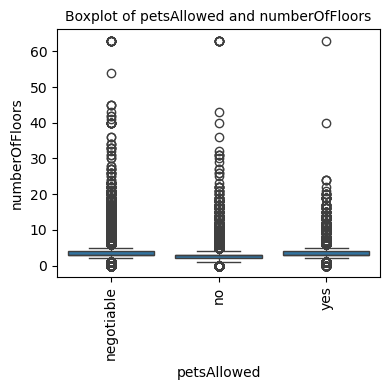

numberOfFloors vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,17064.581651,1896.064628,667.768436,0.0
Residual,253963.0,721103.656902,2.839404,NaN,NaN


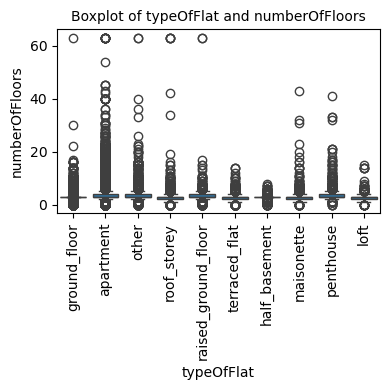

numberOfFloors vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,4451.791408,494.643490,171.212115,0.0
Residual,253963.0,733716.447145,2.889068,NaN,NaN


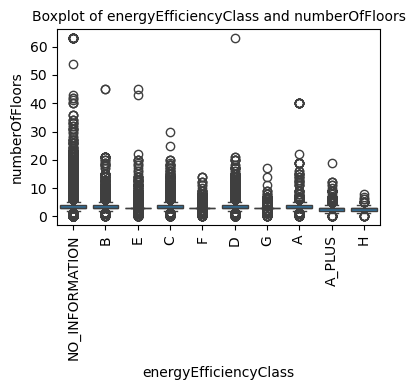

noRoomsRange vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,1918.038950,127.869263,148.031885,0.0
Residual,253957.0,219366.891157,0.863795,NaN,NaN


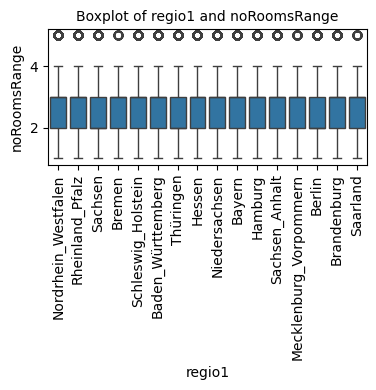

noRoomsRange vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,2717.712810,209.054832,242.906309,0.0
Residual,253959.0,218567.217297,0.860640,NaN,NaN


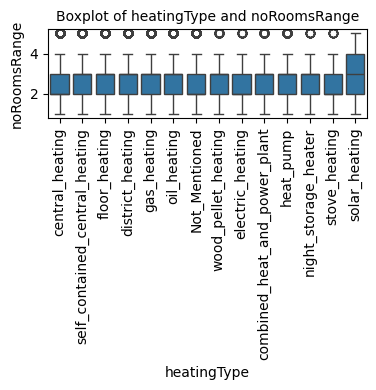

noRoomsRange vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,287.603621,143.801811,165.256958,1.890058e-72
Residual,253970.0,220997.326485,0.870171,NaN,NaN


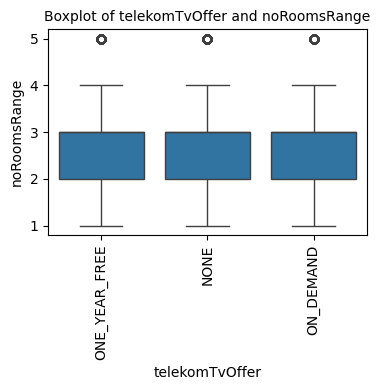

noRoomsRange vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,2725.881047,302.875672,351.937907,0.0
Residual,253963.0,218559.049060,0.860594,NaN,NaN


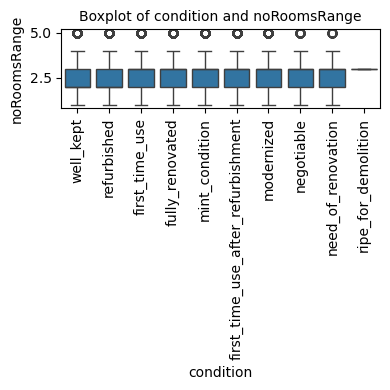

noRoomsRange vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,4476.945241,2238.472621,2622.158459,0.0
Residual,253970.0,216807.984865,0.853676,NaN,NaN


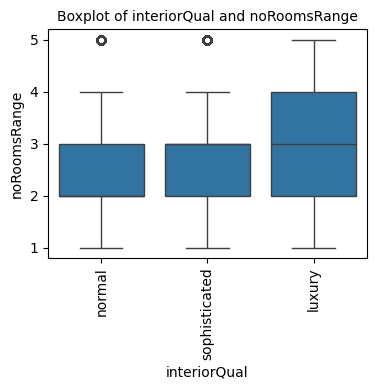

noRoomsRange vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,423.138285,211.569143,243.284339,2.779946e-106
Residual,253970.0,220861.791822,0.869637,NaN,NaN


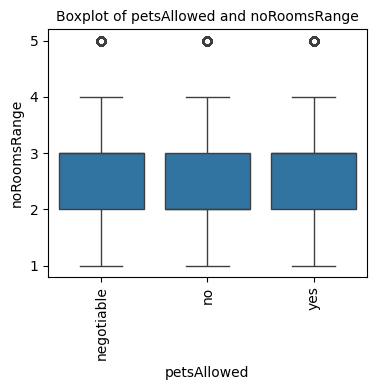

noRoomsRange vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,7641.068713,849.007635,1009.233425,0.0
Residual,253963.0,213643.861394,0.841240,NaN,NaN


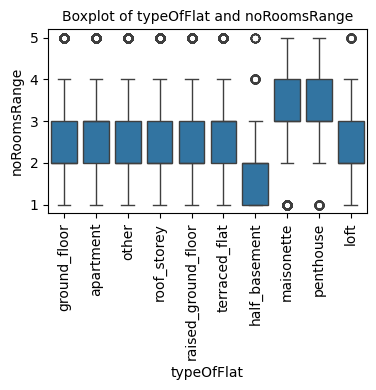

noRoomsRange vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,552.343338,61.371482,70.610715,7.391640e-131
Residual,253963.0,220732.586768,0.869153,NaN,NaN


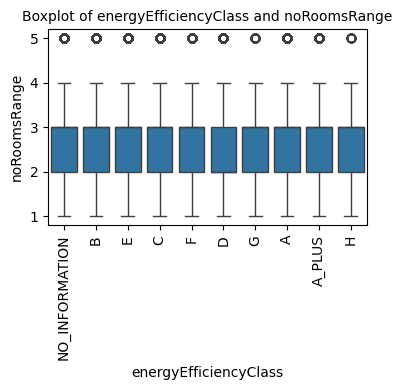

livingSpaceRange vs regio1
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
regio1,15.0,27305.174400,1820.344960,980.743766,0.0
Residual,253957.0,471366.080419,1.856086,NaN,NaN


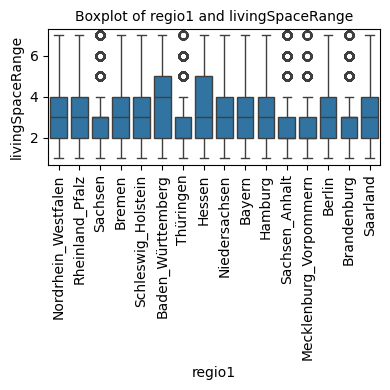

livingSpaceRange vs heatingType
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
heatingType,13.0,23319.812300,1793.831715,958.363997,0.0
Residual,253959.0,475351.442519,1.871765,NaN,NaN


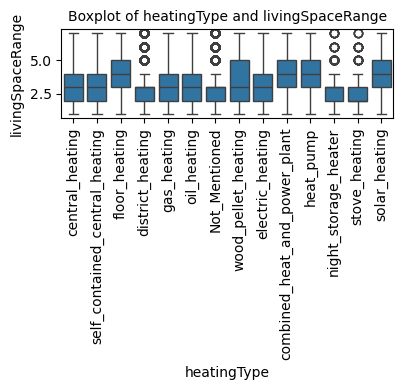

livingSpaceRange vs telekomTvOffer
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
telekomTvOffer,2.0,2300.788620,1150.394310,588.604002,9.186515e-256
Residual,253970.0,496370.466198,1.954445,NaN,NaN


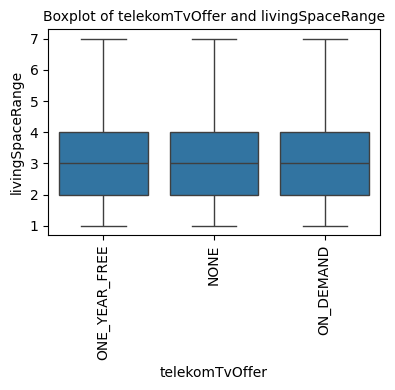

livingSpaceRange vs condition
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
condition,9.0,28353.093923,3150.343769,1701.126644,0.0
Residual,253963.0,470318.160896,1.851916,NaN,NaN


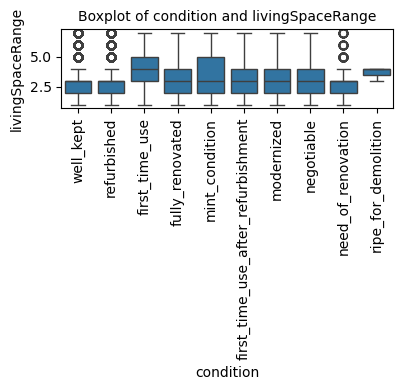

livingSpaceRange vs interiorQual
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
interiorQual,2.0,50380.452198,25190.226099,14271.008205,0.0
Residual,253970.0,448290.802621,1.765133,NaN,NaN


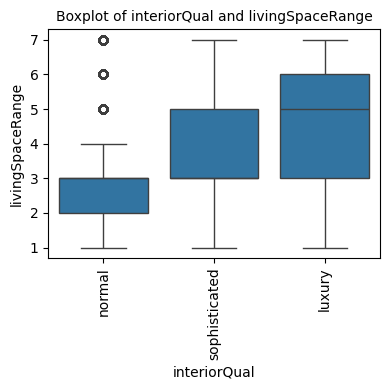

livingSpaceRange vs petsAllowed
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
petsAllowed,2.0,326.492755,163.246377,83.194779,7.599710e-37
Residual,253970.0,498344.762064,1.962219,NaN,NaN


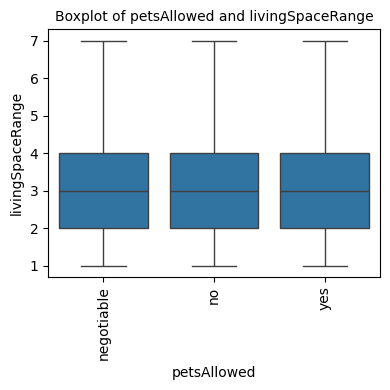

livingSpaceRange vs typeOfFlat
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
typeOfFlat,9.0,45721.074656,5080.119406,2848.353795,0.0
Residual,253963.0,452950.180163,1.783528,NaN,NaN


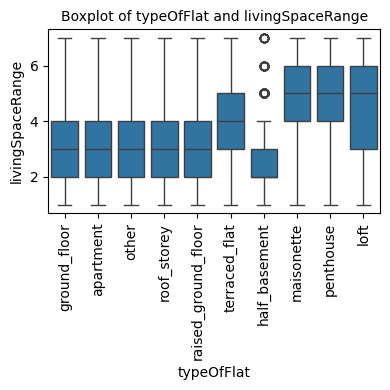

livingSpaceRange vs energyEfficiencyClass
Anova Table


,df,sum_sq,mean_sq,F,PR(>F)
energyEfficiencyClass,9.0,7073.108131,785.900903,406.001838,0.0
Residual,253963.0,491598.146687,1.935708,NaN,NaN


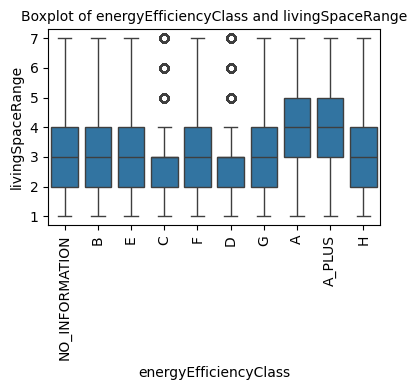

In [ ]:
# Performs ANOVA analysis for all combinations of quantitative and categorical variables.
for i in quant_data.columns:
    for j in cat_data1.columns:
        print(f'{i} vs {j}')
        print(f'Anova Table')
        model = ols(f'{i} ~ {j}', data = df).fit()
        anova_table = anova_lm(model)
        display(anova_table)

        # Grouped boxplots
        plt.figure(figsize = (4,4))
        sns.boxplot(x = cat_data[j], y = quant_data[i])
        plt.xticks(rotation=90)
        plt.xlabel(f'{j}')
        plt.ylabel(f'{i}')
        plt.title(f'Boxplot of {j} and {i}', fontsize = 10)
        plt.tight_layout()
        plt.show()

In [154]:
# Significance between groups
p_value_mixed = model.f_pvalue
f_value_mixed = model.fvalue
print(f'p_value: {p_value_mixed}')
print(f'F-stat: {f_value_mixed}', '\n')

p_value: 0.0
F-stat: 406.00183807816455 



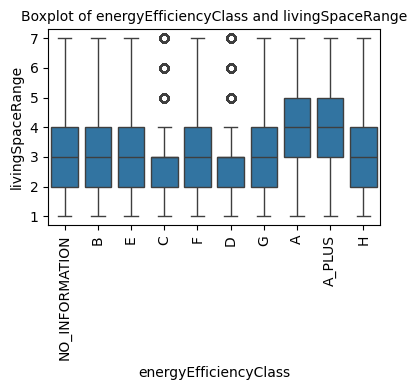

In [155]:
# Grouped boxplots
plt.figure(figsize = (4,4))
sns.boxplot(x = cat_data[j], y = quant_data[i])
plt.xticks(rotation=90)
plt.xlabel(f'{j}')
plt.ylabel(f'{i}')
plt.title(f'Boxplot of {j} and {i}', fontsize = 10)
plt.tight_layout()
plt.show()